Ονομ/νυμο: **Βασιλική Παπαγεοεργίου** ΑΜ: **03116673**

# Εργαστηριακή Άσκηση 2. Μη επιβλεπόμενη μάθηση. 
## Σύστημα συστάσεων βασισμένο στο περιεχόμενο
## Σημασιολογική απεικόνιση δεδομένων με χρήση SOM 
Ημερομηνία εκφώνησης της άσκησης: 23 Νοεμβρίου 2021

**Θα βρείτε το παρόν σε μορφή jupyter notebook ως συνημμένο στο τέλος της εκφώνησης.**


In [ ]:
!pip install --upgrade pip
!pip install --upgrade numpy
!pip install --upgrade pandas
!pip install --upgrade nltk
!pip install --upgrade scikit-learn
!pip install --upgrade joblib

## Εισαγωγή του Dataset

Το σύνολο δεδομένων με το οποίο θα δουλέψουμε είναι βασισμένο στο [Carnegie Mellon Movie Summary Corpus](http://www.cs.cmu.edu/~ark/personas/). Πρόκειται για ένα dataset με 22.301 περιγραφές ταινιών. Η περιγραφή κάθε ταινίας αποτελείται από τον τίτλο της, μια ή περισσότερες ετικέτες που χαρακτηρίζουν το είδος της ταινίας και τέλος τη σύνοψη της υπόθεσής της. Αρχικά εισάγουμε το dataset (χρησιμοποιήστε αυτούσιο τον κώδικα, δεν χρειάζεστε το αρχείο csv) στο dataframe `df_data_1`: 

In [ ]:
import pandas as pd

dataset_url = "https://drive.google.com/uc?export=download&id=1-tN5rC1QCgwqL67cvIXdMbtd-Xf9Xqow"
df_data_1 = pd.read_csv(dataset_url, sep='\t',  header=None, quoting=3)

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Κάθε ομάδα θα δουλέψει σε **ένα μοναδικό υποσύνολο 5.000 ταινιών** (διαφορετικό dataset για κάθε ομάδα) ως εξής:

1. Κάθε ομάδα του εργαστηρίου νευρωνικών έχει έναν αριθμό στο helios. Θα βάλετε τον αριθμό αυτό στη μεταβλητή team_seed_number στο επόμενο κελί κώδικα.

2. Το data frame `df_data_2` έχει γραμμές όσες και οι ομάδες και 5.000 στήλες. Σε κάθε ομάδα αντιστοιχεί η γραμμή του πίνακα με το `team_seed_number` της. Η γραμμή αυτή θα περιλαμβάνει 5.000 διαφορετικούς αριθμούς που αντιστοιχούν σε ταινίες του αρχικού dataset. 

3. Τρέξτε τον κώδικα. Θα προκύψουν τα μοναδικά για κάθε ομάδα  titles, categories, catbins, summaries και corpus με τα οποία θα δουλέψετε.

In [ ]:
import numpy as np

# Στο επόμενη γραμή βάλτε τον αριθμό της ομάδας στο εργαστήριο των νευρωνικών
team_seed_number = 108

movie_seeds_url = "https://drive.google.com/uc?export=download&id=1-oeMf7BFmiH70XObgC9WOTo-a9cDJZwP"
df_data_2 = pd.read_csv(movie_seeds_url, header=None)

# επιλέγεται 
my_index = df_data_2.iloc[team_seed_number,:].values

titles = df_data_1.iloc[:, [2]].values[my_index] # movie titles (string)
categories = df_data_1.iloc[:, [3]].values[my_index] # movie categories (string)
bins = df_data_1.iloc[:, [4]]
catbins = bins[4].str.split(',', expand=True).values.astype(float)[my_index] # movie categories in binary form (1 feature per category)
summaries =  df_data_1.iloc[:, [5]].values[my_index] # movie summaries (string)
corpus = summaries[:,0].tolist() # list form of summaries
corpus_df = pd.DataFrame(corpus) # dataframe version of corpus

In [ ]:
print(titles.shape)
print(categories.shape)
print(bins.shape)
print(catbins.shape)
print(summaries.shape)
print(len(corpus))
print(len(corpus_df))
print(corpus_df.shape)

(5000, 1)
(5000, 1)
(22302, 1)
(5000, 322)
(5000, 1)
5000
5000
(5000, 1)


- Ο πίνακας **titles** περιέχει τους τίτλους των ταινιών. Παράδειγμα: 'Sid and Nancy'.
- O πίνακας **categories** περιέχει τις κατηγορίες (είδη) της ταινίας υπό τη μορφή string. Παράδειγμα: '"Tragedy",  "Indie",  "Punk rock",  "Addiction Drama",  "Cult",  "Musical",  "Drama",  "Biopic \[feature\]",  "Romantic drama",  "Romance Film",  "Biographical film"'. Παρατηρούμε ότι είναι μια comma separated λίστα strings, με κάθε string να είναι μια κατηγορία.
- Ο πίνακας **catbins** περιλαμβάνει πάλι τις κατηγορίες των ταινιών αλλά σε δυαδική μορφή ([one hot encoding](https://hackernoon.com/what-is-one-hot-encoding-why-and-when-do-you-have-to-use-it-e3c6186d008f)). Έχει διαστάσεις 5.000 x 322 (όσες οι διαφορετικές κατηγορίες). Αν η ταινία ανήκει στο συγκεκριμένο είδος η αντίστοιχη στήλη παίρνει την τιμή 1, αλλιώς παίρνει την τιμή 0.
- Ο πίνακας **summaries** και η λίστα **corpus** περιλαμβάνουν τις συνόψεις των ταινιών (η corpus είναι απλά ο summaries σε μορφή λίστας). Κάθε σύνοψη είναι ένα (συνήθως μεγάλο) string. Παράδειγμα: *'The film is based on the real story of a Soviet Internal Troops soldier who killed his entire unit  as a result of Dedovschina. The plot unfolds mostly on board of the prisoner transport rail car guarded by a unit of paramilitary conscripts.'*
- το dataframe corpus_df που είναι απλά το corpus σε μορφή dataframe. Τα summaries βρίσκονται στην κολόνα 0. Πιθανώς να σας βολεύει να κάνετε κάποιες προεπεξεργασίες με dataframes.


Θεωρούμε ως **ID** της κάθε ταινίας τον αριθμό γραμμής της ή το αντίστοιχο στοιχείο της λίστας. Παράδειγμα: για να τυπώσουμε τη σύνοψη της ταινίας με `ID=999` (την χιλιοστή) θα γράψουμε `print(corpus[999])`.

In [ ]:
ID = 488
print(titles[ID])
print(categories[ID])
print(catbins[ID])
print(corpus[ID])
print(corpus_df)

['The Incredible Hulk']
['"Thriller",  "Science Fiction",  "Superhero movie",  "Action/Adventure",  "Reboot",  "Action"']
[0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0

# Εφαρμογή 1. Υλοποίηση συστήματος συστάσεων ταινιών βασισμένο στο περιεχόμενο
<img src="http://clture.org/wp-content/uploads/2015/12/Netflix-Streaming-End-of-Year-Posts.jpg" width="70%">

Η πρώτη εφαρμογή που θα αναπτύξετε θα είναι ένα [σύστημα συστάσεων](https://en.wikipedia.org/wiki/Recommender_system) ταινιών βασισμένο στο περιεχόμενο (content based recommender system). Τα συστήματα συστάσεων στοχεύουν στο να προτείνουν αυτόματα στο χρήστη αντικείμενα από μια συλλογή τα οποία ιδανικά θέλουμε να βρει ενδιαφέροντα ο χρήστης. Η κατηγοριοποίηση των συστημάτων συστάσεων βασίζεται στο πώς γίνεται η επιλογή (filtering) των συστηνόμενων αντικειμένων. Οι δύο κύριες κατηγορίες είναι η συνεργατική διήθηση (collaborative filtering) όπου το σύστημα προτείνει στο χρήστη αντικείμενα που έχουν αξιολογηθεί θετικά από χρήστες που έχουν παρόμοιο με αυτόν ιστορικό αξιολογήσεων και η διήθηση με βάση το περιεχόμενο (content based filtering), όπου προτείνονται στο χρήστη αντικείμενα με παρόμοιο περιεχόμενο (με βάση κάποια χαρακτηριστικά) με αυτά που έχει προηγουμένως αξιολογήσει θετικά.

Το σύστημα συστάσεων που θα αναπτύξετε θα βασίζεται στο **περιεχόμενο** και συγκεκριμένα στις συνόψεις των ταινιών (corpus). 


## Προεπεξεργασία

Το πρώτο βήμα στην επεξεργασία μας είναι ο καθαρισμός των περιγραφών των ταινιών. 

Εκτυπώστε (αρκετές) διαφορετικές περιγραφές ταινιών για να δείτε πιθανά προβλήματα που θα πρέπει να αντιμετωπιστούν.

Τα (ελάχιστα) βήματα καθαρισμού που προτείνουμε είναι:
- μετατροπή όλων των χαρακτήρων σε πεζά,
- αφαίρεση των stopwords. Εδώ σημειώστε ότι για το δεδομένο task του συστήματος συστάσεων που είναι η πρόταση ταινιών ίσως θα είχαν ενδιαφέρον και λίστες stopwords πέραν αυτών της κοινής γλώσσας.
- αφαίρεση σημείων στίξης και ειδικών χαρακτρήρων (special characters). Αυτό δεν γίνεται μόνο με την punkt του NLTK. Θα μπορούσατε να βασιστείτε σε κανονικές εκφράσεις (regular expressions), και
- αφαίρεση πολυ σύντομων συμβολοσειρών.

Προσοχή: το corpus και τα τελικά tokens που θα το αποτελούν θα χρησιμοποιηθούν στη συνέχεια ως κλειδιά για να βρούμε εμφυτεύματα. Για το λόγο αυτό, πρέπει να είστε προσεκτικοί ως προς την εφαρμογή μεθόδων κανονικοποίησης (text normalization) όπως το stemming και το lemmatization.

In [ ]:
# imports and initializations 
#Natural Language Toolkit  
import numpy as np
import nltk

nltk.download('stopwords') # κατεβάζουμε ένα αρχείο που έχει stopwords στα αγγλικά
from nltk.corpus import stopwords
import string

nltk.download('punkt') # χρειάζεται για το tokenizer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

nltk.download('wordnet') # απαραίτητα download για τους stemmer/lemmatizer
nltk.download('rslp')

from collections import Counter

from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

from nltk.stem.porter import PorterStemmer
porter_stemmer = PorterStemmer()

import re


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package rslp to /root/nltk_data...
[nltk_data]   Unzipping stemmers/rslp.zip.


#### Συχνότητα Εμφάνισης:
Βλέπουμε αρχικά το πλήθος των λέξεων που έχουμε, το οποίο είναι πολύ μεγάλο. Κατόπιν τυπώνουμε την συχνότητα εμφάνισής τους και βλέπουμε ότι πρέπει να αφαιρέσουμε τα stopwords καθώς και τα σημεία στίξης. 

In [ ]:
import nltk

# Total Words in corpus
words = []
for doc in corpus:
    words += nltk.word_tokenize(doc)
print("Total words in corpus:\t", len(words))

counts = Counter(words)
print(counts)

Total words in corpus:	 1754616
Counter({',': 92368, 'the': 87381, '.': 77517, 'to': 56134, 'and': 53848, 'a': 43062, 'of': 30639, 'is': 26447, 'in': 23618, 'his': 22061, 'her': 17242, "'s": 16912, 'he': 16389, 'that': 16106, 'with': 15802, 'him': 11397, 'for': 10910, 'by': 10811, 'The': 10441, 'on': 9080, 'as': 8837, 'she': 8551, 'who': 8378, 'but': 7566, 'from': 7156, 'they': 6672, 'an': 6555, 'has': 6553, 'at': 6401, 'their': 6146, 'are': 6092, 'it': 5496, 'out': 5057, 'He': 4832, '``': 4827, 'into': 4816, "''": 4720, 'up': 4538, 'them': 4285, 'be': 4214, 'was': 3942, 'not': 3919, 'when': 3518, 'then': 3312, 'which': 3168, 'one': 3059, 'after': 3004, 'about': 2986, 'have': 2840, 'back': 2616, 'where': 2593, 'two': 2516, 'all': 2485, 'will': 2469, 'film': 2463, 'She': 2434, 'When': 2372, 'father': 2359, 'In': 2329, 'After': 2257, 'had': 2229, 'this': 2222, 'tells': 2194, 'while': 2149, ';': 2126, 'man': 2121, 'off': 2096, 'They': 2077, 'can': 2053, 'other': 2041, 'been': 2036, 'only'

#### Stop Words:
Για την βελτιστοποίηση του recommendation system μας, προχωρήσαμε σε περιορισμό των δεδομένων μας (ρίξαμε τη διαστατικότητα), δηλαδή των λέξεων της περιγραφής των ταινιών. Αυτό ήταν απαραίτητο καθώς τα δεδομένα ήταν πολύ μεγάλα και εμπόδιζαν την σωστή λειτουργία του συστήματος, καθώς πολλές λέξεις δεν προσέφεραν καθόλου στο σύστημα συστάσεων (δεν είχαν σημασιολογική αξία). Για να το πετύχουμε αυτό φτιάξαμε μία λίστα λέξεων (stop_words) την οποία θα αφαιρέσουμε από τις περιγραφές.

In [ ]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
# Stopwords
stop_words = set(ENGLISH_STOP_WORDS).union(stopwords.words('english'))
stop_words = stop_words.union(["movie", "film", "plot", "cinema", "opens", "n't", "'s"]) 
print(stop_words)

{"you'll", 'aren', 'under', 'six', "couldn't", 'alone', 'doing', 'nor', 'amoungst', 'five', 'ie', 'would', 'thus', 'system', 'always', 'doesn', 'until', 'being', 'everything', 'still', 'anything', 'behind', "didn't", 'few', 'how', 'becomes', 'weren', 'not', 'than', 'when', 'yourselves', 'hence', 'are', 'off', 'twenty', "you're", 'eg', 'that', 'three', 'before', 'else', 'whenever', 'hundred', 'mill', 'un', "doesn't", 'we', "shan't", 'after', 'his', 'anyhow', 'couldn', 'thru', 'anywhere', 'whereby', 'elsewhere', 's', 'which', 'may', 'via', 'above', 'first', 'hereby', 'already', 'fifty', 'give', 'thin', 'out', 'did', 'wherever', 'herein', "that'll", 'seemed', 'interest', 'will', 'somewhere', 'cry', 'front', 'somehow', 'moreover', 'is', 'isn', 'all', 'yourself', 'either', 'third', 'could', 'nothing', 'indeed', 'noone', 'needn', 'every', 'i', 'fill', 'one', 'shouldn', 'cant', 'latterly', 'herself', 'by', 'where', "weren't", 'beforehand', 'an', 'enough', "mightn't", 'these', 'otherwise', 'th

#### Φίλτρα:
Κατόπιν φτιάχνουμε την συνάρτηση filter_punctuation η οποία κόβει  όλα τα σημεία στίξης, ακόμα και τα διπλά σημεία στίξης.

In [ ]:
# Punctuation !#$%&'()*+,-./:;<=>?@[\]^_`{|}~’“” 
extra_punctuation = set(string.punctuation) # mutable
extra_punctuation = extra_punctuation.union(["—", ".", "’", "“", "”", "…", "0","1","2","3","4","5","6","7","8","9"])


def punctuation_filter(words):
    filtered_words = []
    for word in words:
        pun = []
        for letter in word:
            pun.append(letter in extra_punctuation)
        if not all(pun):
            filtered_words.append(word)
    return filtered_words
    

Επίσης περνάμε τις λέξεις από Stemmer, για να κόψουμε τις καταλήξεις και λέξεις με την ίδια ρίζα να θεωρούνται ίδιες.

In [ ]:
from nltk.stem.porter import PorterStemmer

def preprocess_document(document):
    words = nltk.word_tokenize(document)

    # punctuation
    filtered_words = [word for word in words if word.lower() not in list(stop_words) + list(extra_punctuation)]
    brief_cleaning = (re.sub("[^A-Za-z']+", ' ', str(row)).lower() for row in filtered_words)
    clean_words = punctuation_filter(brief_cleaning)
    
    # stemming
    words = [PorterStemmer().stem(word) for word in clean_words]

    return " ".join(words)

In [ ]:
# Preprocessing corpus   DO NOT RUN THIS CELL AGAIN
clean_corpus = [preprocess_document(doc) for doc in corpus]

#### Έλεγχος:
Όπως βλέπουμε το πλήθος των λέξεων μειώθηκε πολύ. Αυτή η μείωση της διαστατικότητας ωφελεί τον υπολογισμό ομοιότητας τόσο στην ακρίβεια όσο και στην πολυπλοκότητα.

Παρακάτω αποθηκεύουμε το clean_corpus για να μην το τρέχουμε κάθε φορά.

In [ ]:
words=[]
for doc in clean_corpus:
    words += nltk.word_tokenize(doc)
print("Total words in clean_corpus:\t", len(words))
#print("Total words in preprocessed_corpus:\t", len(set(words)))
from collections import Counter
counts = Counter(words)
print(counts)

Total words in clean_corpus:	 782972
Counter({'kill': 3526, 'tell': 3019, 'tri': 2815, 'leav': 2770, 'father': 2538, 'make': 2514, 'love': 2504, 'man': 2375, 'friend': 2359, 'time': 2354, 'come': 2235, 'return': 2213, 'day': 2110, 'take': 2070, 'find': 2066, 'life': 2018, 'famili': 2014, 'new': 2013, 'meet': 2011, 'get': 2003, 'end': 2002, 'help': 1995, 'hous': 1977, 'work': 1955, 'home': 1947, 'begin': 1887, 'later': 1860, 'live': 1823, 'year': 1811, 'decid': 1778, 'use': 1763, 'mother': 1707, 'run': 1700, 'arriv': 1663, 'polic': 1605, 'goe': 1572, 'away': 1571, 'young': 1552, 'final': 1545, 'fall': 1529, 'son': 1527, 'escap': 1515, 'marri': 1515, 'reveal': 1469, 'turn': 1455, 'discov': 1448, 'want': 1448, 'attempt': 1444, 'ask': 1440, 'wife': 1439, 'way': 1433, 'night': 1425, 'girl': 1413, 'car': 1403, 'old': 1374, 'start': 1332, 'forc': 1331, 'stori': 1325, 'say': 1294, 'woman': 1293, 'daughter': 1292, 'die': 1276, 'plan': 1257, 'attack': 1257, 'see': 1249, 'men': 1241, 'follow': 12

In [ ]:
# save  
import joblib
joblib.dump(clean_corpus, 'clean_corpus.pkl')

['clean_corpus.pkl']

In [ ]:
# load
import joblib
clean_corpus = joblib.load('/content/drive/My Drive/ece/NN/lab2/clean_corpus.pkl') 

## Μετατροπή σε TFIDF

Το πρώτο βήμα θα είναι λοιπόν να μετατρέψετε το corpus σε αναπαράσταση tf-idf:

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
# create sparse tf_idf representation
vectorizer = TfidfVectorizer()
vectorizer.fit(corpus)
corpus_tf_idf_plain = vectorizer.transform(corpus).toarray()

Η συνάρτηση [TfidfVectorizer](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) όπως καλείται εδώ **δεν είναι βελτιστοποιημένη**. Οι επιλογές των μεθόδων και παραμέτρων της μπορεί να έχουν **δραματική επίδραση στην ποιότητα των συστάσεων** και είναι διαφορετικές για κάθε dataset. Επίσης, οι επιλογές αυτές έχουν πολύ μεγάλη επίδραση και στη **διαστατικότητα και όγκο των δεδομένων**. Η διαστατικότητα των δεδομένων με τη σειρά της θα έχει πολύ μεγάλη επίδραση στους **χρόνους εκπαίδευσης**, ιδιαίτερα στη δεύτερη εφαρμογή της άσκησης.

Προσοχή: ο TfidfVectorizer έχει κάποιες δυνατότητες προεπεξεργασίας παρόμοιες με αυτές που αναφέραμε στην προηγούμενη ενότητα. Ό,τι προεπεξεργασία μπορείτε να κάνετε που χρειάζεται ως είσοδο μόνο το κάθε document ξεχωριστά, κάντε την στο πρώτο βήμα της προεπεξεργασίας. Αν χρειάζεται γνώση των συνολικών στατιστικών της συλλογής, κάντε την με τον TfidfVectorizer.

In [ ]:
print(corpus_tf_idf_plain.shape) # 5000 x (number of words)
print(vectorizer.vocabulary_)
print(corpus_tf_idf_plain[488])

(5000, 48601)
{'in': 21032, 'the': 43317, 'last': 24382, 'months': 28248, 'of': 30299, 'second': 38224, 'world': 47802, 'war': 46886, 'empire': 14030, 'japan': 22341, 'receives': 35170, 'final': 15827, 'gift': 17594, 'from': 16825, 'collapsing': 8768, 'nazi': 29276, 'germany': 17506, '507': 587, 'highly': 19702, 'advanced': 1308, 'submarine': 41729, 'equipped': 14431, 'with': 47623, 'experimental': 14961, 'technology': 42977, 'this': 43454, 'sleek': 39770, 'behemoth': 4500, 'bears': 4343, 'strong': 41584, 'resemblance': 36005, 'toward': 44117, 'french': 16737, 'surcouf': 42143, 'and': 2256, 'is': 22050, 'imaging': 20818, 'that': 43309, 'far': 15344, 'advance': 1307, 'era': 14436, 'primitive': 33515, 'sonar': 40284, 'mission': 27904, 'as': 3029, 'revealed': 36253, 'by': 6573, 'grim': 18319, 'chief': 7942, 'staff': 40922, 'asakura': 3036, 'following': 16325, 'atomic': 3291, 'bombings': 5500, 'hiroshima': 19806, 'nagasaki': 28955, 'to': 43823, 'intercept': 21704, 'ships': 39013, 'transpor

## Υλοποίηση του συστήματος συστάσεων

Το σύστημα συστάσεων που θα υλοποιήσετε θα είναι μια συνάρτηση `content_recommender` με τρία ορίσματα: `target_movie`, `max_recommendations` και `corpus_type`. Στην `target_movie` περνάμε το ID μιας ταινίας-στόχου για την οποία μας ενδιαφέρει να βρούμε παρόμοιες ως προς το περιεχόμενο (τη σύνοψη) ταινίες, `max_recommendations` στο πλήθος.
Υλοποιήστε τη συνάρτηση ως εξής: 
- για την ταινία-στόχο, θα υπολογίζετε την [ομοιότητα συνημιτόνου](https://en.wikipedia.org/wiki/Cosine_similarity) της με όλες τις ταινίες της συλλογής σας όπως αυτές αναπαριστώνται στο `corpus_type`.
- με βάση την ομοιότητα συνημιτόνου που υπολογίσατε, δημιουργήστε ταξινομημένο πίνακα από το μεγαλύτερο στο μικρότερο, με τα indices (`ID`) των ταινιών. Παράδειγμα: αν η ταινία με index 1 έχει ομοιότητα συνημιτόνου με 3 ταινίες \[0.2 1 0.6\] (έχει ομοιότητα 1 με τον εαύτό της) ο ταξινομημένος αυτός πίνακας indices θα είναι \[1 2 0\].
- Για την ταινία-στόχο εκτυπώστε: id, τίτλο, σύνοψη, κατηγορίες (categories)
- Για τις `max_recommendations` ταινίες (πλην της ίδιας της ταινίας-στόχου που έχει cosine similarity 1 με τον εαυτό της) με τη μεγαλύτερη ομοιότητα συνημιτόνου (σε φθίνουσα σειρά), τυπώστε σειρά σύστασης (1 πιο κοντινή, 2 η δεύτερη πιο κοντινή κλπ), ομοιότητα συνημιτόνου, id, τίτλο, σύνοψη, και κατηγορίες (categories)


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

def content_recommender(target_movie,max_recommendations, corpus_type):

  sim_movie_list=[]
  for i in range(len(corpus_type)):
    sim_movie_list.append( float(cosine_similarity([corpus_type[target_movie]], [corpus_type[i]])) )
  
  sim_movie_list_sorted=sorted(sim_movie_list)

  sim_movie_argmax=np.argsort(sim_movie_list)[::-1]

  recommended_movies=sim_movie_argmax[1:max_recommendations+1]

  return recommended_movies, sim_movie_list_sorted

In [ ]:
#-----EXAMPLE-----
target_movie = 99
max_recommendations = 5
print("target movie information:\n", "ID:", target_movie, "\n", "title:", titles[target_movie],
      "\n", "movie_plot:", corpus[target_movie], "\n", "movie_categories:", categories[target_movie])
print()
print()

recommendations,_ = content_recommender(target_movie, max_recommendations,corpus_tf_idf_plain)
print("Recommendations")
for i,rec_movie in enumerate(recommendations):
    print(str(i+1) + ".")
    #print("similarity ", similaritycosine[i])
    print("movie_id:", rec_movie)
    print("movie_title:", titles[rec_movie])
    print("movie_plot:", corpus[rec_movie])
    print("movie_categories:", categories[rec_movie])
    print()

target movie information:
 ID: 99 
 title: ['Mothers & Daughters'] 
 movie_plot: Lives start to unravel during an eventful dinner party when the group are forced to face their issues head on. For one couple, vicar Dan  and his wife Emma  are faced with the revelation that one of them has been having an affair with the evening’s hostess Kate . Worse of all she has to in turn face her mother  who drops in to “help-out”. Drug fueled sex, lustful longings and how to make cous-cous… are there some things a girl shouldn't share with her mother? Even the therapist  has to face her own maternal misgivings as she returns home to deal with the aftermath of her own mother’s descent into Alzheimer’s - a startling performance by Jean Boht as Mary. Nina  explores the painful reality of having to care for a sick mother who, when she was well, appeared not to care for either Nina or her sister. A funny, honest and often tender look at the complicated relationships that create the unique bond between M

In [ ]:
#-----EXAMPLE 2-----
target_movie = 488
max_recommendations = 5
print("target movie information:\n", "ID:", target_movie, "\n", "title:", titles[target_movie],
      "\n", "movie_plot:", corpus[target_movie], "\n", "movie_categories:", categories[target_movie])
print()
print()

recommendations,_ = content_recommender(target_movie, max_recommendations,corpus_tf_idf_plain)
print("Recommendations")
for i,rec_movie in enumerate(recommendations):
    print(str(i+1) + ".")
    print("movie_id:", rec_movie)
    print("movie_title:", titles[rec_movie])
    print("movie_plot:", corpus[rec_movie])
    print("movie_categories:", categories[rec_movie])
    print()

target movie information:
 ID: 488 
 title: ['The Incredible Hulk'] 
 movie_plot:  At Culver University in Virginia, General Thaddeus "Thunderbolt" Ross  meets with Dr. Bruce Banner , the colleague and lover of his daughter Betty , regarding an experiment which is meant, as Ross claims, to make humans immune to gamma radiation. The experiment—which is part of an operation Ross hopes will restart Dr. Abraham Erskine's failed "super soldier" program —fails and exposes Banner to huge amounts of gamma radiation. This has the effect of transforming Banner into the Hulk whenever Banner becomes angry. As the Hulk, he destroys the lab and injures Betty. Afterwards, he flees the scene. Banner, realizing what he had done, leaves the U.S, becoming a fugitive from the U.S. military on orders by Ross. Five years later, Banner works at a bottling factory in Rocinha, Rio de Janeiro, while searching for a cure for his condition. On the Internet, he collaborates with a colleague he knows only as "Mr. B

#### Παρατηρίσεις: 
Βλέπουμε πως τα αποτελέσματα δεν είναι πολύ σχετικά. Δεν έχουν κοινές κατηγορίες αν και κάποιες ταιριάζουν μεταξύ τους. 


## Βελτιστοποίηση του TfidfVectorizer

Αφού υλοποιήσετε τη συνάρτηση `content_recommender` χρησιμοποιήστε την για να βελτιστοποιήσετε την `TfidfVectorizer`. Συγκεκριμένα, αρχικά μπορείτε να δείτε τι επιστρέφει το σύστημα για τυχαίες ταινίες-στόχους και για ένα μικρό `max_recommendations` (2 ή 3). Αν σε κάποιες ταινίες το σύστημα μοιάζει να επιστρέφει σημασιολογικά κοντινές ταινίες σημειώστε το `ID` τους. Δοκιμάστε στη συνέχεια να βελτιστοποιήσετε την `TfidfVectorizer` για τα συγκεκριμένα `ID` ώστε να επιστρέφονται σημασιολογικά κοντινές ταινίες για μεγαλύτερο αριθμό `max_recommendations`. Παράλληλα, όσο βελτιστοποιείτε την `TfidfVectorizer`, θα πρέπει να λαμβάνετε καλές συστάσεις για μεγαλύτερο αριθμό τυχαίων ταινιών. 

Ταυτόχρονα, μια αντίρροπη κατά κάποιο τρόπο κατεύθυνση της βελτιστοποίησης είναι να χρησιμοποιείτε τις παραμέτρους του `TfidfVectorizer` έτσι ώστε να μειώνονται οι διαστάσεις του Vector Space Model μέχρι το σημείο που θα αρχίσει να εμφανίζονται επιπτώσεις στην ποιότητα των συστάσεων. 




#### Δημιουργία corpus_tf_idf βελτιστοποιημένου: 
Καθώς έχουμε περάσει τα δεδομένα μας από προεπεξεργασία θα δοκιμάσουμε ξανά να καλέσαμε τη συνάρτηση TfidfVectorizer με παραμέτρους προς βελτιστοποίηση. 

> Οι παράμετροι που αποφασίσαμε πως οδηγούν στο καλύτερο αποτέλεσμα είναι το `max_df` και `min_df`. 

Έγιναν πολλές δοκιμές για να καταλήξουμε στις τελικές. 
* Ξεκινώντας από την `max_df`, παρατηρήθηκε πως η παράμετρος αυτή δε συμβάλει σημαντικά στη μείωση των λέξεων που χρησιμοποιούνται συχνά, καθώς επηρεάζοντας την τιμή της από 0.2 έως 0.5 το αποτέλεσμα δεν άλλαζε. Αυτό έγινε καθώς στα προηγούμενα στάδια προεπεξεργασίας των λέξεων, δηλαδή στα stop_words που είχαμε δημιουργήσει, είχαμε καταφέρει να βάλουμε σε αυτά πολύ μεγάλο πλήθος λέξεων που χρησιμοποιούνται συχνά. 
> Έτσι δώσαμε στην `max_df = 0.5` τυπικά, δηλαδή να κόβει τις λέξεις που εμφανίζονται τουλάχιστον στα μισά κείμενα. 
* Για την τιμή `min_df` κάναμε πολλές δοκιμές. Δε δουλέψαμε με ποσοστό λέξεων στα κείμενα σε αυτή την παράγραφο αλλά με πλήθος λέξεων. Δηλαδή δοκιμάζοντας το `min_df = a` κόβουμε τις λέξεις που εμφανίζονται λιγότερες φορές από a σε όλα συνολικά τα κείμενα. Η παράμετρος αυτή είχε την κύρια επίδραση στην απόδοση του συστήματος συστάσεων. Τιμές κάτω από 10 δεν έκοβαν αρκετές λέξεις ώστε να γίνει αποτελεσματικό το σύστημα ενώ τιμές πάνω από 20 μπορεί να έκοβαν όπως περιμέναμε περισσότερες λέξεις αλλά αυτό γινόταν σε μεγάλο βαθμό με αποτέλεσμα να μένουν λίγες λέξεις και να οδηγούμαστε στο άλλο άκρο, όπου έχουμε μειώσει δραστικά το πλήθος των λέξεων και το σύστημα αδυνατεί να βρει ομοιότητες μεταξύ των ταινιών. 
>Δοκιμάζοντας ενδιάμεσα νούμερα από 11 έως 19 και ελέγχοντας τα αποτελέσματα που έδινε το σύστημα συστάσεων τόσο οπτικά όσο και μέσω της ομοιότητας συνημιτόνου δώσαμε την τιμή `min_df = 15`.

In [ ]:
clean_corpus[0:10]

['month second world war empir japan receiv final gift collaps nazi germani i  highly advanc submarin equip experiment technology thi sleek behemoth bear strong resembl french submarin surcouf equip imag technolog far advanc era primit sonar technolog mission reveal grim chief staff asakura follow atom bomb hiroshima nagasaki intercept u s  ship transport nuclear weapon tinian island princip base american b  bomber strike japanes home island man charg mission command masami brilliant destroy enemi ship reliev command oppos navi increas relianc suicid tactic given chanc redeem burn zeal ignor variou secret i  carri board sea lt  takasu owlish technician charg imag refus tell masami work masami discov crew member belong   kaiten suicid corp idea   moment u s  navi track i  usual masami wonder go say sweet voic teenag girl master plan minisub pilot protector  ',
 'rosewood relat histor event januari   race riot rosewood florida white attack black burn town mental unstabl white woman fanni

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_df=0.5, min_df=15)
vectorizer.fit(clean_corpus)
corpus_tf_idf = vectorizer.transform(clean_corpus).toarray()
print(corpus_tf_idf.shape) # 5000 x (number of words)
# print(vectorizer.vocabulary_["where"])

(5000, 4566)


In [ ]:
print(corpus_tf_idf.shape) # 5000 x (number of words)
print(vectorizer.vocabulary_)
print(corpus_tf_idf[488])

(5000, 4566)
{'month': 2642, 'second': 3589, 'world': 4524, 'war': 4430, 'empir': 1342, 'japan': 2192, 'receiv': 3282, 'final': 1556, 'gift': 1731, 'collaps': 776, 'nazi': 2708, 'germani': 1724, 'advanc': 58, 'submarin': 3955, 'equip': 1392, 'experiment': 1456, 'bear': 356, 'strong': 3932, 'resembl': 3381, 'french': 1660, 'imag': 2029, 'technolog': 4076, 'far': 1503, 'era': 1393, 'primit': 3113, 'mission': 2610, 'reveal': 3409, 'grim': 1798, 'chief': 684, 'staff': 3858, 'follow': 1605, 'atom': 254, 'bomb': 451, 'intercept': 2138, 'ship': 3670, 'transport': 4212, 'nuclear': 2778, 'weapon': 4453, 'island': 2172, 'princip': 3116, 'base': 336, 'american': 137, 'bomber': 453, 'strike': 3927, 'japanes': 2193, 'home': 1947, 'man': 2488, 'charg': 661, 'command': 798, 'brilliant': 504, 'destroy': 1103, 'enemi': 1357, 'reliev': 3341, 'oppos': 2829, 'navi': 2706, 'increas': 2069, 'suicid': 3976, 'tactic': 4045, 'given': 1737, 'chanc': 653, 'redeem': 3304, 'burn': 545, 'ignor': 2020, 'variou': 435

Ορίσαμε την συνάρτηση print_results για να παίρνουμε τα αποτελέσματα του content_recommender 

In [ ]:
def print_results(target_movie, max_recommendations, corpus_tfidf):

    print("target movie information:\n", "ID:", target_movie, "\n", "title:", titles[target_movie],
        "\n", "movie_plot:", corpus[target_movie], "\n", "movie_categories:", categories[target_movie], "\n")
    print()

    recommendations, sort_cos = content_recommender(target_movie, max_recommendations, corpus_tfidf)

    print("Recommendations")
    for i,rec_movie in enumerate(recommendations):
        print(str(i+1) + ".")
        print("movie_id:", rec_movie)
        print("movie_title:", titles[rec_movie])
        print("movie_categories:", categories[rec_movie])
        print()

    print(pd.DataFrame(sort_cos[::-1]).iloc[:max_recommendations+1])

In [ ]:
print_results(1077, 5, corpus_tf_idf)

target movie information:
 ID: 1077 
 title: ['Big Bird in Japan'] 
 movie_plot: Separated from their guided tour group while in Japan, Big Bird and Barkley find help from a friendly young woman who is planning to leave Japan at the same time they will be, and from the same town, Kyoto. She offers to take the pair to Kyoto as she says good-bye to family and friends along the way. Big Bird witnesses some of Japan's beauty, its landscape and culture, with the help of the mysterious young woman and the friends of hers he stays with. She introduces him to a Japanese family, and teaches him some simple Japanese vocabulary.  Big Bird is increasingly vexed by the fact that he has not learned the young woman's name, and the fact that she has a tendency to have disappeared quite suddenly when he turns to speak to her. One night, finding difficulty in sleeping on a futon, he happens to catch sight of her standing in the garden, singing an achingly melancholy song to the moon. Attending an elemen

Φαίνεται να έχουν κάποια συνάφεια οι ταινίες, αναφέρουν όλες πτηνά στην πλοκή τους και κάποιες παρόμοιες κατηγορίες. Βλέπουμε πως οι πρώτες έχουν σχεδόν `50% cosine similarity`. 

In [ ]:
print_results(488, 5, corpus_tf_idf)

target movie information:
 ID: 488 
 title: ['The Incredible Hulk'] 
 movie_plot:  At Culver University in Virginia, General Thaddeus "Thunderbolt" Ross  meets with Dr. Bruce Banner , the colleague and lover of his daughter Betty , regarding an experiment which is meant, as Ross claims, to make humans immune to gamma radiation. The experiment—which is part of an operation Ross hopes will restart Dr. Abraham Erskine's failed "super soldier" program —fails and exposes Banner to huge amounts of gamma radiation. This has the effect of transforming Banner into the Hulk whenever Banner becomes angry. As the Hulk, he destroys the lab and injures Betty. Afterwards, he flees the scene. Banner, realizing what he had done, leaves the U.S, becoming a fugitive from the U.S. military on orders by Ross. Five years later, Banner works at a bottling factory in Rocinha, Rio de Janeiro, while searching for a cure for his condition. On the Internet, he collaborates with a colleague he knows only as "Mr. B

Δεν βρέθηκε κάποια ταινία που να ταιριάζει με την ταινία "The Incredible Hulk", δεν επιστράφησαν ούτε καν ταινίες με παρόμοιες κατηγορίες. Το μόνο που βλέπουμε είναι πως στην 3η ταινία πως ο τίτλος έχει το όνομα του πρωταγωνιστή μας "Bruce" χωρίς αυτό να σχετίζεται κάπως με την πλοκή. 

In [ ]:
print_results(2588, 5, corpus_tf_idf)

target movie information:
 ID: 2588 
 title: ["Tora-san's Promise"] 
 movie_plot: Tora-san returns to his family's home to attend an elementary school class reunion. After he embarrasses himself by getting drunk and insulting all his ex-classmates, he resumes his travels. In Kyushu he meets an outspoken 18-year-old girl who becomes enamored of Tora-san and follows him around. One of Tora-san's old friends is terminally ill and makes Tora-san promise him to marry his wife once he is gone.<ref name  http://www.kinejun.jp/cinema/id/17135|title2010-01-21|languageKinema Junpo}}<ref name Stuart |last Stuart Galbraith IV|urlTora-san 28: Tora-san's Promise  |date2010-01-21|publisherhttp://ftvdb.bfi.org.uk/sift/title/305836|title2010-01-21|publisher=British Film Institute}} 
 movie_categories: ['"Japanese Movies"'] 
 tora san return famili home attend elementari school class reunion embarrass get drunk insult ex classm resum travel kyushu meet outspoken  year old girl enamor tora san follow tor

Επέστρεψε πράγματι πολύ κοντινές ταινίες.
Φαίνεται πως στην λίστα των 5000 ταινιών υπάρχει ολόκληρη η σειρά ταινιών με τον/ην "Tora-san" και ο recommender μας τις επιστρέφει. Έχουν πολύ υψηλό `cosine similarity`

## Βαθιά μάθηση: δημιουργία corpora με χρήση word emmbeddings

Η προσέγγιση της κατασκευής μόνο μέσω tfidf του συστήματος συστάσεων έχει διάφορα μειονεκτήματα. Θα μας ενδιέφερε λοιπόν να δούμε αν μπορούμε να χρησιμοποιήσουμε για τις λέξεις **εμφυτεύματα (embeddings)**, δηλαδή τις πυκνές διανυσματικές αναπαραστάσεις για τις λέξεις που μας δίνει το μοντέλο **Word2Vec**

Ωστόσο, το dataset της κάθε ομάδας είναι πολύ μικρό για να εξάγουμε τα δικά μας word embeddings (και να είναι καλά). Για το λόγο αυτό θα χρησιμοποιήσουμε τη μεθοδολογία της Βαθιάς Μάθησης που είναι η **Μεταφορά Μάθησης (Transfer Learning).**.

Στη μεταφορά μάθησης ουσιαστικά μεταφέρουμε τη γνώση που έχει αποκτήσει ένα ήδη εκπαιδευμένο (και κατά κανόνα πολύ μεγάλο) σύστημα. Η μεταφορά γίνεται διαμέσου των τιμών των βαρών που έχει προσδιορίσει μετά το πέρας της εκπαίδευσης.

Στην περίπτωσή μας, δεν μας ενδιαφέρουν τόσο τα ίδια τα βάρη των μοντέλων από τα οποία θα κάνουμε μεταφορά μάθησης. Κάτι τέτοιο θα μας ενδιέφερε αν π.χ. θέλαμε να συνεχίσουμε την εκπαίδευση στα δικά μας κείμενα. Μας ενδιαφέρουν όμως τα ίδια τα εμφυτεύματα, δηλαδή τα embeddings (διανύσματα διαστάσεων $m$) που έχει μάθει το νευρωνικό για το λεξιλόγιο του (vocabulary). To vocabulary σε τέτοια μεγάλα νευρωνικά θα είναι πιθανότατα υπερσύνολο του δικού μας.

### Μεταφορά μάθησης εμφυτευμάτων



#### Εμφυτεύματα του Gensim-data
Το Gensim περιλαμβάνει αρκετά προεκπαιδευμένα μοντέλα εμφυτευμάτων Word2Vec. Με το επόμενο κελί παίρνουμε τη λίστα τους.

In [ ]:
!pip install -U gensim
import gensim.downloader
print(list(gensim.downloader.info()['models'].keys()))

     |████████████████████████████████| 24.1 MB 1.2 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0
['fasttext-wiki-news-subwords-300', 'conceptnet-numberbatch-17-06-300', 'word2vec-ruscorpora-300', 'word2vec-google-news-300', 'glove-wiki-gigaword-50', 'glove-wiki-gigaword-100', 'glove-wiki-gigaword-200', 'glove-wiki-gigaword-300', 'glove-twitter-25', 'glove-twitter-50', 'glove-twitter-100', 'glove-twitter-200', '__testing_word2vec-matrix-synopsis']


Τα μοντέλα αυτά βρίσκονται στο [αποθετήριο Gensim-data](https://github.com/RaRe-Technologies/gensim-data) όπου μπορείτε να βρείτε και την τεκμηρίωσή τους. Η φόρτωση των μοντέλων αυτών γίνεται με τη συνάρτηση `gensim.downloader.load`.

In [ ]:
w2v_model_gigaword = gensim.downloader.load('glove-wiki-gigaword-100')
w2v_model_twitter = gensim.downloader.load('glove-twitter-100')

[==================================================] 100.0% 128.1/128.1MB downloaded
[==================================================] 100.0% 387.1/387.1MB downloaded


#### Άλλα εμφυτεύμαατα
Μπορείτε να βρείτε προεκπαιδευμένα εμφυτεύματα και από πηγές εκτός του Gensim. Για παράδειγμα:

- [Google News dataset](https://code.google.com/archive/p/word2vec/). Πρόκειται για προ-εκπαιδευμένα διανύσματα που έχουν εκπαιδευτεί σε μέρος του συνόλου δεδομένων Google News (περίπου 100 δισεκατομμύρια λέξεις). Το μοντέλο περιέχει διανύσματα 300 διαστάσεων για 3 εκατομμύρια λέξεις και φράσεις.
- [Amazon BlazingText](https://docs.aws.amazon.com/sagemaker/latest/dg/blazingtext.html). Το BlazingText δεν είναι μόνο προεκπαιδευμένα εμφυτεύματα αλλα και βελτιστοποιημένες υλοποιήσεις των αλγορίθμων Word2vec για την επεξεργασία κειμένου. Προυπόθεση είναι να δουλέψει κανείς στο SageMaker.

Οι διαδικασίες φόρτωσης embeddings από εξωτερικά δεδομένα μπορεί να είναι ελαφρά διαφορετικές από αυτή του Gensim.



#### Παρατηρήσεις

*   Επαναλαμβάνουμε ότι στην εργασία αυτή δεν μας ενδιαφέρουν τα ίδια τα μοντέλα αλλά το να μπορούμε για μία λέξη του λεξιλογίου μας να μπορούμε να βρούμε το embedding (διάνυσμα) που της αντιστοιχεί στο εκάστοτε προεκπαιδευμένο μοντέλο. 

*   Επίσης, δεν θα χρησιμοποιήσουμε την `Phrases` για να βρούμε bigrams στο dataset μας όπως θα ήταν το ορθότερο, καθώς αυτό θα απαιτούσε την συνέχιση της εκπαίδευσης του μοντέλου σε νέο λεξιλόγιο με πολύ λίγα νέα δεδομένα.


 ### Δημιουργία corpora βασισμένων στα εμφυτεύματα

Για να μπορέσουμε να ενσωματώσουμε τη γνώση που υπάρχει στα προεκπαιδευμένα εμφυτεύματα στο δικό μας corpus θα προχωρήσουμε όπως περιγράφεται ακολούθως.

Για κάθε περιγραφή ταινίας $d$, η οποία αποτελείται από τις $N_d$ λέξεις $w_i$, το  $tfidf$ της κάθε λέξης $w_i$ δίνεται από τη σχέση:

$$ tfidf(w_i) = tf(w_i,d) \cdot idf(w_i)$$

Ταυτόχρονα, σε κάθε λέξη $w_i$ αντιστοιχεί ένα διάνυσμα $W2V(w_i)$ από το μοντέλο εμφυτευμάτων που έχουμε εισάγει. Τα διανύσματα εμφυτευμάτων $W2V$ θα έχουν διάσταση $m$, ανάλογα το μοντέλο. 

Για κάθε ταινία d, μπορούμε να δημιουργήσουμε μια διανυσματική αναπαράσταση $W2V(d)$ διαστάσεων $m$ χρησιμοποιώντας το $tfidf(w_i)$ ως συντελεστή βαρύτητας για κάθε εμφύτευμα $W2V(w_i)$:

$$ W2V(d) = \frac{tfidf(w_1)\cdot W2V(w_i) + tfidf(w_2)\cdot W2V(w_2) + \dotsc  + tfidf(w_{N_{d}})\cdot W2V(w_{N_{d}})}{tfidf(w_1)+tfidf(w_2)+ \dotsc + tfidf(w_{N_{d}})}$$


#### emmbeddings_only
Αρχικά κρατάμε μόνο όσες λέξεις ανήκουν στο κάθε w2v model, μόνο τα embeddings δηλαδή.  

In [ ]:
def emmbeddings_only(corpus, w2v_model):
    corpus = corpus.split()
    corpus  = [word for word in corpus if word in w2v_model]
    return ' '.join(corpus)

w2v_corpus_twitter = [emmbeddings_only(doc, w2v_model_twitter) for doc in clean_corpus]
w2v_corpus_gigaword = [emmbeddings_only(doc, w2v_model_gigaword) for doc in clean_corpus]

#### idfs
Έπειτα υπολογίζουμε το Inverse Document Frequency (idf) το οποίο είναι ένας δείκτης της πληροφορίας που δίνει η κάθε λέξη. Κρατάμε για κάθε μοντέλο διαφορετικά λεξικά. 

In [ ]:
from collections import defaultdict

def idfs(corpus):
    appearances = {}
    appearances = defaultdict(lambda: 0, appearances)
    for corp in corpus:
        words = corp.split()
        for word in words:
            appearances[word] +=1
    idf = { key: np.log(len(corpus)/value) for key,value in appearances.items()}
    return idf

idf_twitter = idfs(w2v_corpus_twitter)
idf_gigaword = idfs(w2v_corpus_gigaword)

#### word_it_idf
Θα χρειαστούμε επίσης το Term Frequency (tf) που είναι στην ουσία η συχνότητα με την οποία εμφανίζεται ο κάθε όρος/λέξη στο corpus. Στην ίδια συνάρτηση θα εξάγουμε και το γινόμενο idf * tf με δεδομένα που ήδη υπολογίσαμε. Έτσι για κάθε λέξη έχουμε την tfidf αναπαράστασή της.

In [ ]:
def word_tf_idf(corpus, idf): #corpus = 1 summary
    words_tfidf_vector = []
    for word in corpus.split():
        tf = corpus.count(word)/len(corpus)
        words_tfidf_vector.append(tf*idf[word])
    return np.array(words_tfidf_vector)

#### build_tfw2v

Υλοποιήστε μια συνάρτηση `build_tfw2v` με ορίσματα:
- `corpus` που θα είναι το προεπεξεργασμένο dataset σας,
- `vectors` που θα είναι το μοντέλο που θα σας δίνει τα διανύσματα των εμφυτεύσεων vectors, και 
- `embeddings_size` που θα είναι η διάσταση των εμφυτευμάτων $m$.

H συνάρτηση αυτή θα επιστρέφει ένα νέο corpus που θα είναι ένας πίνακας 5000 (όσες οι ταινίες σας) x $100$ (το η διάσταση των εμφυτευμάτων). Ανάλογα ποιο μοντέλο χρησιμποιείτε για transfer learning ο πίνακας αυτός θα είναι διαφορετικός.

In [ ]:
def build_tfw2v (corpus,vectors,idf):
    corpus_tfw2v = []
    for i,corp in enumerate(corpus):
        w2v_vectors = np.array([vectors[word] for word in corp.split()])
        words_tfidf_vector = word_tf_idf(corp, idf)
        num = np.array([[w2v_vectors[word_i,dim]*words_tfidf_vector[word_i] for dim in range(100)] for word_i in range(w2v_vectors.shape[0])])
        corpus_tfw2v.append(num/ sum(words_tfidf_vector))
    return  corpus_tfw2v 


In [ ]:
w2v_tfidf_corpus_twitter = build_tfw2v(w2v_corpus_twitter, w2v_model_twitter, idf_twitter)
w2v_tfidf_corpus_twitter = np.array(w2v_tfidf_corpus_twitter)
print(w2v_tfidf_corpus_twitter.shape)
print(w2v_tfidf_corpus_twitter[0:2])

(5000,)
[array([[-8.87550023e-04, -6.19997791e-04, -3.58145021e-04, ...,
         1.18335689e-03,  1.94624670e-04, -8.99920516e-04],
       [ 5.80417828e-04,  7.37001586e-05,  5.80888611e-04, ...,
        -5.35483787e-05, -6.35211069e-05,  1.80220875e-04],
       [-2.77237861e-04, -2.73142346e-04,  1.71573556e-05, ...,
        -4.91576234e-04,  3.96226883e-04, -2.85838458e-04],
       ...,
       [ 9.81613961e-05,  5.31764117e-04,  1.54830737e-04, ...,
         4.55143113e-04, -3.29876569e-04, -6.96279254e-04],
       [ 3.22115834e-04,  1.51032944e-04, -4.80181648e-04, ...,
         6.60477196e-04, -1.45962311e-03, -1.02521416e-04],
       [-2.09202266e-03, -5.51246387e-04, -3.80277236e-03, ...,
        -6.77932872e-05, -1.21744731e-03,  1.57787053e-03]])
 array([[ 2.16925458e-03, -4.65136359e-03,  3.91916593e-04, ...,
         3.60749624e-03, -1.00014675e-02,  9.11777801e-03],
       [-8.64638626e-04, -1.96481725e-04, -2.67128076e-04, ...,
         2.70683098e-04, -5.23998236e-04, -7.

In [ ]:
w2v_tfidf_corpus_gigaword = build_tfw2v(w2v_corpus_gigaword, w2v_model_gigaword, idf_gigaword)
w2v_tfidf_corpus_gigaword = np.array(w2v_tfidf_corpus_gigaword)
print(w2v_tfidf_corpus_gigaword.shape)
print(w2v_tfidf_corpus_gigaword[0:2])

(5000,)
[array([[ 4.09864442e-04,  2.70694556e-04,  4.16390417e-04, ...,
         8.85842175e-04,  9.84528377e-04, -8.31225206e-04],
       [ 1.53363892e-04,  1.69247027e-05,  1.18972609e-03, ...,
         2.02635668e-04,  2.37322234e-04, -9.56703238e-04],
       [ 5.48775561e-04,  1.24581215e-03,  1.27482607e-03, ...,
        -5.67835436e-04,  6.98074369e-04,  4.90078217e-04],
       ...,
       [-1.80600740e-04,  2.84039025e-04, -4.53498963e-05, ...,
         1.30733726e-04,  8.02109769e-04,  3.48274046e-05],
       [-3.22256932e-05, -9.50967826e-04,  8.33687614e-04, ...,
        -6.52118604e-04, -8.67117764e-04, -2.14592519e-03],
       [-4.96627373e-04, -3.54220289e-04,  2.80840029e-03, ...,
        -7.90279607e-04,  5.20472523e-05, -9.71451482e-05]])
 array([[-1.70553563e-03,  7.10598259e-03,  2.56963631e-03, ...,
        -4.51555209e-04,  7.75382392e-03, -3.85315461e-03],
       [ 8.14166560e-05,  8.58814058e-04,  7.54829158e-05, ...,
         4.38807653e-04,  2.33327012e-03,  6.

Κι έτσι δημιουργήσαμε corpora βασισμένων στα εμφυτεύματα

# Ανάλυση αποτελεσμάτων

### Σύστημα συστάσεων βασισμένο μόνο στο tfidf

- Σε markdown περιγράψτε τι προεπεξεργασία κάνετε στα κείμενα και γιατί.
(*έχει σχολιαστεί αναλυτικά στο πάνω μέρος*)
- Περιγράψτε πως προχωρήσατε στις επιλογές σας για τη βελτιστοποίηση της `TfidfVectorizer`. 
(*έχει σχολιαστεί αναλυτικά στο πάνω μέρος*)

- [Cherry-picking:](https://www.wikiwand.com/en/Cherry_picking) Δώσετε παραδείγματα (IDs) από τη συλλογή σας που επιστρέφουν καλά αποτελέσματα μέχρι `max_recommendations` (τουλάχιστον 5) και σχολιάστε.

- [Nir-picking:](https://www.merriam-webster.com/dictionary/nit-picking) Δώστε παραδείγματα (IDs) από τη συλλογή σας που επιστρέφουν κακά αποτελέσματα και σχολιάστε.

- Ποια είναι συνολικά τα πλεονεκτήματα και μειονεκτήματα ενός recommender βασισμένου στο tfidf;

#### Cherry-picking:  
Παραδείγματα (IDs) από τη συλλογή μας που επιστρέφουν καλά αποτελέσματα. 
>Ας πουμε στην πρώτη περίπτωση βλέπουμε να έχει φέρει πολύ κοντινές ταινίες και μάλιστα από τον τίτλο και μόνο μπορούμε να φανταστούμε πως η μία είναι συνέχεια της αλλης και μιλάμε για κάποια/ον "Tora-san".

>Στην δευτερη βλέπουμε πως η ταινία πραγματεύεται κάποια πτηνά, και έχει φέρει εξίσου ταινίες αντίστοιχου περιεχομένου με καλό similarity. 

>Ενώ στην τελευταία φαίνεται να έχει επιστρέψει την ίδια ταινία σε άλλη παραγωγή ή έστω διαφορετική καταγραφή στο αρχείο μας, που είναι επιτυχία για τον recommender μας. 

In [ ]:
print_results_plain(2588, 5, corpus_tf_idf)
print_results_plain(1077, 5, corpus_tf_idf)
print_results_plain(678, 5, corpus_tf_idf)
print_results_plain(3777, 5, corpus_tf_idf)

Target movie information:
 ID: 2588   title: ["Tora-san's Promise"] 
 movie_plot: Tora-san returns to his family's home to attend an elementary school class reunion. After he embarrasses himself by getting drunk and insulting all his ex-classmates, he resumes his travels. In Kyushu he meets an outspoken 18-year-old girl who becomes enamored of Tora-san and follows him around. One of Tora-san's old friends is terminally ill and makes Tora-san promise him to marry his wife once he is gone.<ref name  http://www.kinejun.jp/cinema/id/17135|title2010-01-21|languageKinema Junpo}}<ref name Stuart |last Stuart Galbraith IV|urlTora-san 28: Tora-san's Promise  |date2010-01-21|publisherhttp://ftvdb.bfi.org.uk/sift/title/305836|title2010-01-21|publisher=British Film Institute}} 
 movie_categories: ['"Japanese Movies"'] 


Recommendations
1.
movie_id: 4598 movie_title: ["Tora-san's Sunrise and Sunset"]
movie_categories: ['"Japanese Movies"']

2.
movie_id: 2122 movie_title: ['Foster Daddy, Tora!']
mo

#### Nir-picking: 
Παραδείγματα (IDs) από τη συλλογή σας που επιστρέφουν κακά αποτελέσματα.
>Εδώ η πρώτη ταινία δεν καταφέρνει να βρεί ακρίβεια όυτε 20%

>Οι υπολοιπες έχουν αντι=ίστοιχα αποτελέσματα ακόμα κι αν κάποιες κατηγορίες είναι ταιριαστές.



In [ ]:
print_results_plain(1846, 5, corpus_tf_idf)
print_results_plain(1053, 5, corpus_tf_idf)
print_results_plain(1777, 5, corpus_tf_idf)

Target movie information:
 ID: 1846   title: ['A Price Above Rubies'] 
 movie_plot: The film tells the story of Sonia , a young Brooklyn woman who has just given birth to her first child. She is married, through an arranged marriage, to Mendel , a devout Hasidic Jew who is too immersed in his studies to give his wife the attention she craves. As a result, Sonia develops a relationship with Mendel's brother, the jeweller Sender , who brings her into the business. Sender is the only release for Sonia's repressed sexuality, and he takes full advantage of that fact as often as he can, but she is repelled by his utter lack of morals as she finds balance between what she feels and what she has been taught is "sinful". The jewellery business brings her into close contact with the young Puerto Rican artist and jewellery designer Ramon , but when Sender finds out about their connection he reveals it to the family, and Sonia is divorced and ostracised. The film ends on a more tolerance-friendly 

## Συνολικά τα πλεονεκτήματα και μειονεκτήματα ενός recommender βασισμένου στο tfid:

Πλεονεκτήματα:
- Το TF-IDF μας δίνει τη δυνατότητα να συσχετίσουμε κάθε λέξη σε ένα έγγραφο με έναν αριθμό που αντιπροσωπεύει πόσο συχνή είναι κάθε λέξη στο εκάστοτε έγγραφο. 
- Παρέχει κάποια βασική μέτρηση για την εξαγωγή των πιο περιγραφικών όρων σε ένα έγγραφο. 
- Μπορεί εύκολα να υπολογίσει την ομοιότητα μεταξύ 2 εγγράφων. 

Μειονεκτήματα:
- Το TF-IDF βασίζεται στο μοντέλο "bag-of-words" (BoW), επομένως δεν καταγράφει τη θέση στο κείμενο, τη σημασιολογία, τις συνυπάρξεις σε διαφορετικά έγγραφα κ.λπ.
- Για αυτόν τον λόγο, το TF-IDF είναι χρήσιμο μόνο ως χαρακτηριστικό λεξιλογικού επιπέδου
- Δεν είναι δυνατή η καταγραφή της σημασιολογίας (π.χ. σε σύγκριση με μοντέλα θεμάτων, ενσωματώσεις λέξεων)

# Εφαρμογή 2.  Τοπολογική και σημασιολογική απεικόνιση της ταινιών με χρήση SOM
<img src="https://i.imgur.com/Z4FdurD.jpg" width="60%">

## Δημιουργία dataset


Στη δεύτερη εφαρμογή θα βασιστούμε στις τοπολογικές ιδιότητες των Self Organizing Maps (SOM) για να φτιάξουμε ενά χάρτη (grid) δύο διαστάσεων όπου θα απεικονίζονται όλες οι ταινίες της συλλογής της ομάδας με τρόπο χωρικά συνεκτικό ως προς το περιεχόμενο και κυρίως το είδος τους (ο παραπάνω χάρτης είναι ενδεικτικός, δεν αντιστοιχεί στο dataset μας). 

Διαλέξτε για την αναπαράσταση των documents αυτήν που πιστεύετε απέδωσε καλύτερα στο πρώτα σκέλος της άσκησης. Έστω ότι αυτή είναι η `my_best_corpus`.

Η έτοιμη συνάρτηση `build_final_set` θα ενώσει την αναπαράσταση που θα της δώσετε ως όρισμα `mycorpus` με τις binarized κατηγορίες `catbins` των ταινιών ως επιπλέον κολόνες (χαρακτηριστικά). Συνεπώς, κάθε ταινία αναπαρίσταται στο Vector Space Model από τα χαρακτηριστικά της αναπαράστασης `mycorpus` και τις κατηγορίες της.

Τέλος, η συνάρτηση δέχεται ένα ορισμα για το πόσες ταινίες να επιστρέψει, με default τιμή όλες τις ταινίες (5000). Αυτό είναι χρήσιμο για να μπορείτε αν θέλετε να φτιάχνετε μικρότερα σύνολα δεδομένων ώστε να εκπαιδεύεται ταχύτερα το SOM. 

Θα τρέχουμε τη συνάρτηση με `final_set = build_final_set(my_best_corpus)`.

In [ ]:
import joblib
best_tf_idf_corpus = joblib.load('/content/drive/My Drive/ece/NN/lab2/best_tf_idf_corpus.pkl') 

In [ ]:
def build_final_set(mycorpus, doc_limit = 5000, tf_idf_only=False):
    # convert sparse tf_idf to dense tf_idf representation
    dense_tf_idf = mycorpus[0:doc_limit,:]
    if tf_idf_only:
        # use only tf_idf
        final_set = dense_tf_idf
    else:
        # append the binary categories features horizontaly to the (dense) tf_idf features
        final_set = np.hstack((dense_tf_idf, catbins[0:doc_limit,:]))
    # η somoclu θέλει δεδομ΄ένα σε float32
    return np.array(final_set, dtype=np.float32)

In [ ]:
my_best_corpus = best_tf_idf_corpus
final_set = build_final_set(my_best_corpus)

Στο επόμενο κελί, τυπώνουμε τις διαστάσεις του τελικού dataset μας. **Χωρίς βελτιστοποίηση του TFIDF** θα έχουμε περίπου 50.000 χαρακτηριστικά και ο θα είναι ανέφικτο να προχωρήσουμε στην εκπαίδευση του SOM.

In [ ]:
final_set.shape

(5000, 4853)

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 0.98)
pca_final = pca.fit_transform(final_set)
print(pca_final.shape)

(5000, 2209)


## Εκπαίδευση χάρτη SOM

Θα δουλέψουμε με τη βιβλιοθήκη SOM ["Somoclu"](http://somoclu.readthedocs.io/en/stable/index.html). Εισάγουμε τις somoclu και matplotlib και λέμε στη matplotlib να τυπώνει εντός του notebook (κι όχι σε pop up window).

In [ ]:
# install somoclu
!pip install --upgrade somoclu

     |████████████████████████████████| 6.1 MB 4.7 MB/s 
  Created wheel for somoclu: filename=somoclu-1.7.5.1-cp37-cp37m-linux_x86_64.whl size=481103 sha256=1dd9cbe978ec1dd1594b6327a355a9c0ffb21f5e292870fca548f3e3cc9c8ec8
  Stored in directory: /root/.cache/pip/wheels/d5/81/eb/22b023e9cac575c4b87d3f9a7318094124e5d8cf90600726fa
Successfully built somoclu


In [ ]:
# import sompoclu, matplotlib
import somoclu
import matplotlib
# we will plot inside the notebook and not in separate window
%matplotlib inline

In [ ]:
import joblib

In [ ]:
joblib.dump(pca_final, 'pca_final.pkl')

['pca_final.pkl']

In [ ]:
joblib.dump(final_set, 'final_set.pkl')

['final_set.pkl']

Καταρχάς διαβάστε το [function reference](http://somoclu.readthedocs.io/en/stable/reference.html) του somoclu. Θα δoυλέψουμε με χάρτη τύπου planar, παραλληλόγραμμου σχήματος νευρώνων με τυχαία αρχικοποίηση (όλα αυτά είναι default). Μπορείτε να δοκιμάσετε διάφορα μεγέθη χάρτη ωστόσο όσο ο αριθμός των νευρώνων μεγαλώνει, μεγαλώνει και ο χρόνος εκπαίδευσης. Για το training δεν χρειάζεται να ξεπεράσετε τα 100 epochs. Σε γενικές γραμμές μπορούμε να βασιστούμε στις default παραμέτρους μέχρι να έχουμε τη δυνατότητα να οπτικοποιήσουμε και να αναλύσουμε ποιοτικά τα αποτελέσματα. Ξεκινήστε με ένα χάρτη 10 x 10, 100 epochs training και ένα υποσύνολο των ταινιών (π.χ. 2000). Χρησιμοποιήστε την `time` για να έχετε μια εικόνα των χρόνων εκπαίδευσης. 

In [ ]:
n_rows, n_columns = 10, 10
som = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
%time som.train(pca_final, epochs=100)

CPU times: user 6min 46s, sys: 1.09 s, total: 6min 48s
Wall time: 3min 39s


In [ ]:
n_rows, n_columns = 20, 20
som = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
%time som.train(pca_final, epochs=100)

CPU times: user 30min 1s, sys: 6.32 s, total: 30min 8s
Wall time: 15min 25s


In [ ]:
n_rows, n_columns = 25, 25
som = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
%time som.train(pca_final, epochs=100)

CPU times: user 46min 41s, sys: 8.66 s, total: 46min 49s
Wall time: 24min 8s


In [ ]:
n_rows, n_columns = 30, 30
som = somoclu.Somoclu(n_columns, n_rows, compactsupport=False)
%time som.train(pca_final, epochs=100)

CPU times: user 1h 7min 54s, sys: 12.6 s, total: 1h 8min 7s
Wall time: 35min


In [ ]:
joblib.dump(som, 'som_10.pkl')

['som_10.pkl']

In [ ]:
joblib.dump(som, 'som_20.pkl')

['som_20.pkl']

In [ ]:
joblib.dump(som, 'som_25.pkl')

['som_25.pkl']

In [ ]:
joblib.dump(som, 'som_30.pkl')

['som_30.pkl']


## Best matching units

Μετά από κάθε εκπαίδευση αποθηκεύστε σε μια μεταβλητή τα best matching units (bmus) για κάθε ταινία. Τα bmus μας δείχνουν σε ποιο νευρώνα ανήκει η κάθε ταινία. **Προσοχή: η σύμβαση των συντεταγμένων των νευρώνων στη Somoclu είναι (στήλη, γραμμή) δηλαδή το ανάποδο από την Python**. Με χρήση της [np.unique](https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.unique.html) (μια πολύ χρήσιμη συνάρτηση στην άσκηση) αποθηκεύστε τα μοναδικά best matching units και τους δείκτες τους (indices) προς τις ταινίες. 

Σημειώστε ότι μπορεί να έχετε λιγότερα μοναδικά bmus από αριθμό νευρώνων γιατί μπορεί σε κάποιους νευρώνες να μην έχουν ανατεθεί ταινίες. Ως αριθμό νευρώνα θα θεωρήσουμε τον αριθμό γραμμής στον πίνακα μοναδικών bmus.



## Ομαδοποίηση (clustering)

Τυπικά, η ομαδοποίηση σε ένα χάρτη SOM προκύπτει από το unified distance matrix (U-matrix): για κάθε κόμβο υπολογίζεται η μέση απόστασή του από τους γειτονικούς κόμβους. Εάν χρησιμοποιηθεί μπλε χρώμα στις περιοχές του χάρτη όπου η τιμή αυτή είναι χαμηλή (μικρή απόσταση) και κόκκινο εκεί που η τιμή είναι υψηλή (μεγάλη απόσταση), τότε μπορούμε να πούμε ότι οι μπλε περιοχές αποτελούν clusters και οι κόκκινες αποτελούν σύνορα μεταξύ clusters.

To somoclu δίνει την επιπρόσθετη δυνατότητα να κάνουμε ομαδοποίηση των νευρώνων χρησιμοποιώντας οποιονδήποτε αλγόριθμο ομαδοποίησης του scikit-learn. Στην άσκηση θα χρησιμοποιήσουμε τον k-Means. Για τον αρχικό σας χάρτη δοκιμάστε ένα k=20 ή 25. Οι δύο προσεγγίσεις ομαδοποίησης είναι διαφορετικές, οπότε περιμένουμε τα αποτελέσματα να είναι κοντά αλλά όχι τα ίδια.



## Αποθήκευση του SOM

Επειδή η αρχικοποίηση του SOM γίνεται τυχαία και το clustering είναι και αυτό στοχαστική διαδικασία, οι θέσεις και οι ετικέτες των νευρώνων και των clusters θα είναι διαφορετικές κάθε φορά που τρέχετε τον χάρτη, ακόμα και με τις ίδιες παραμέτρους. Για να αποθηκεύσετε ένα συγκεκριμένο som και clustering χρησιμοποιήστε και πάλι την `joblib`. Μετά την ανάκληση ενός SOM θυμηθείτε να ακολουθήσετε τη διαδικασία για τα bmus.



## Οπτικοποίηση U-matrix, clustering και μέγεθος clusters

Για την εκτύπωση του U-matrix χρησιμοποιήστε τη `view_umatrix` με ορίσματα `bestmatches=True` και `figsize=(15, 15)` ή `figsize=(20, 20)`. Τα διαφορετικά χρώματα που εμφανίζονται στους κόμβους αντιπροσωπεύουν τα διαφορετικά clusters που προκύπτουν από τον k-Means. Μπορείτε να εμφανίσετε τη λεζάντα του U-matrix με το όρισμα `colorbar`. Μην τυπώνετε τις ετικέτες (labels) των δειγμάτων, είναι πολύ μεγάλος ο αριθμός τους.

Για μια δεύτερη πιο ξεκάθαρη οπτικοποίηση του clustering τυπώστε απευθείας τη μεταβλητή `clusters`.

Τέλος, χρησιμοποιώντας πάλι την `np.unique` (με διαφορετικό όρισμα) και την `np.argsort` (υπάρχουν και άλλοι τρόποι υλοποίησης) εκτυπώστε τις ετικέτες των clusters (αριθμοί από 0 έως k-1) και τον αριθμό των νευρώνων σε κάθε cluster, με φθίνουσα ή αύξουσα σειρά ως προς τον αριθμό των νευρώνων. Ουσιαστικά είναι ένα εργαλείο για να βρίσκετε εύκολα τα μεγάλα και μικρά clusters. 

Ακολουθεί ένα μη βελτιστοποιημένο παράδειγμα για τις τρεις προηγούμενες εξόδους:

<img src="https://image.ibb.co/i0tsfR/umatrix_s.jpg" width="35%">
<img src="https://image.ibb.co/nLgHEm/clusters.png" width="35%">




## Σημασιολογική ερμηνεία των clusters

Προκειμένου να μελετήσουμε τις τοπολογικές ιδιότητες του SOM και το αν έχουν ενσωματώσει σημασιολογική πληροφορία για τις ταινίες διαμέσου της διανυσματικής αναπαράστασης του tf-idf, των εμφυτευμάτων και των κατηγοριών, χρειαζόμαστε ένα κριτήριο ποιοτικής επισκόπησης των clusters. 

Θα υλοποιήσουμε το εξής κριτήριο: Λαμβάνουμε όρισμα έναν αριθμό (ετικέτα) cluster. Για το cluster αυτό βρίσκουμε όλους τους νευρώνες που του έχουν ανατεθεί από τον k-Means. Για όλους τους νευρώνες αυτούς βρίσκουμε όλες τις ταινίες που τους έχουν ανατεθεί (για τις οποίες αποτελούν bmus). Για όλες αυτές τις ταινίες τυπώνουμε ταξινομημένη τη συνολική στατιστική όλων των ειδών (κατηγοριών) και τις συχνότητές τους. Αν το cluster διαθέτει καλή συνοχή και εξειδίκευση, θα πρέπει κάποιες κατηγορίες να έχουν σαφώς μεγαλύτερη συχνότητα από τις υπόλοιπες. Θα μπορούμε τότε να αναθέσουμε αυτήν/ές την/τις κατηγορία/ες ως ετικέτες κινηματογραφικού είδους στο cluster.

Μπορείτε να υλοποιήσετε τη συνάρτηση αυτή όπως θέλετε. Μια πιθανή διαδικασία θα μπορούσε να είναι η ακόλουθη:

1. Ορίζουμε συνάρτηση `print_categories_stats` που δέχεται ως είσοδο λίστα με ids ταινιών. Δημιουργούμε μια κενή λίστα συνολικών κατηγοριών. Στη συνέχεια, για κάθε ταινία επεξεργαζόμαστε το string `categories` ως εξής: δημιουργούμε μια λίστα διαχωρίζοντας το string κατάλληλα με την `split` και αφαιρούμε τα whitespaces μεταξύ ετικετών με την `strip`. Προσθέτουμε τη λίστα αυτή στη συνολική λίστα κατηγοριών με την `extend`. Τέλος χρησιμοποιούμε πάλι την `np.unique` για να μετρήσουμε συχνότητα μοναδικών ετικετών κατηγοριών και ταξινομούμε με την `np.argsort`. Τυπώνουμε τις κατηγορίες και τις συχνότητες εμφάνισης ταξινομημένα. Χρήσιμες μπορεί να σας φανούν και οι `np.ravel`, `np.nditer`, `np.array2string` και `zip`.

2. Ορίζουμε τη βασική μας συνάρτηση `print_cluster_neurons_movies_report` που δέχεται ως όρισμα τον αριθμό ενός cluster. Με τη χρήση της `np.where` μπορούμε να βρούμε τις συντεταγμένες των bmus που αντιστοιχούν στο cluster και με την `column_stack` να φτιάξουμε έναν πίνακα bmus για το cluster. Προσοχή στη σειρά (στήλη - σειρά) στον πίνακα bmus. Για κάθε bmu αυτού του πίνακα ελέγχουμε αν υπάρχει στον πίνακα μοναδικών bmus που έχουμε υπολογίσει στην αρχή συνολικά και αν ναι προσθέτουμε το αντίστοιχο index του νευρώνα σε μια λίστα. Χρήσιμες μπορεί να είναι και οι `np.rollaxis`, `np.append`, `np.asscalar`. Επίσης πιθανώς να πρέπει να υλοποιήσετε ένα κριτήριο ομοιότητας μεταξύ ενός bmu και ενός μοναδικού bmu από τον αρχικό πίνακα bmus.

3. Υλοποιούμε μια βοηθητική συνάρτηση `neuron_movies_report`. Λαμβάνει ένα σύνολο νευρώνων από την `print_cluster_neurons_movies_report` και μέσω της `indices` φτιάχνει μια λίστα με το σύνολο ταινιών που ανήκουν σε αυτούς τους νευρώνες. Στο τέλος καλεί με αυτή τη λίστα την `print_categories_stats` που τυπώνει τις στατιστικές των κατηγοριών.

Μπορείτε βέβαια να προσθέσετε οποιαδήποτε επιπλέον έξοδο σας βοηθάει. Μια χρήσιμη έξοδος είναι πόσοι νευρώνες ανήκουν στο cluster και σε πόσους και ποιους από αυτούς έχουν ανατεθεί ταινίες.

Θα επιτελούμε τη σημασιολογική ερμηνεία του χάρτη καλώντας την `print_cluster_neurons_movies_report` με τον αριθμός ενός cluster που μας ενδιαφέρει. 

Παράδειγμα εξόδου για ένα cluster (μη βελτιστοποιημένος χάρτης, ωστόσο βλέπετε ότι οι μεγάλες κατηγορίες έχουν σημασιολογική  συνάφεια):

```
Overall Cluster Genres stats:  
[('"Horror"', 86), ('"Science Fiction"', 24), ('"B-movie"', 16), ('"Monster movie"', 10), ('"Creature Film"', 10), ('"Indie"', 9), ('"Zombie Film"', 9), ('"Slasher"', 8), ('"World cinema"', 8), ('"Sci-Fi Horror"', 7), ('"Natural horror films"', 6), ('"Supernatural"', 6), ('"Thriller"', 6), ('"Cult"', 5), ('"Black-and-white"', 5), ('"Japanese Movies"', 4), ('"Short Film"', 3), ('"Drama"', 3), ('"Psychological thriller"', 3), ('"Crime Fiction"', 3), ('"Monster"', 3), ('"Comedy"', 2), ('"Western"', 2), ('"Horror Comedy"', 2), ('"Archaeology"', 2), ('"Alien Film"', 2), ('"Teen"', 2), ('"Mystery"', 2), ('"Adventure"', 2), ('"Comedy film"', 2), ('"Combat Films"', 1), ('"Chinese Movies"', 1), ('"Action/Adventure"', 1), ('"Gothic Film"', 1), ('"Costume drama"', 1), ('"Disaster"', 1), ('"Docudrama"', 1), ('"Film adaptation"', 1), ('"Film noir"', 1), ('"Parody"', 1), ('"Period piece"', 1), ('"Action"', 1)]```
   

In [ ]:
def print_categories_stats(list_with_ids):
  total_categories = []
  for items in list_with_ids: #for each movie 
    categ = [category.strip().strip('""') for category in categories[items][0].split(',')] #get the categories
    total_categories.extend(categ)
  unique_cats, counts = np.unique(total_categories, return_counts=True) #find all unique categories and the count for each one
  sorted_counts = np.argsort(counts)[::-1] 

  final_result = [(unique_cats[i], counts[i]) for i in sorted_counts]  
  print(final_result)
  evaluation(final_result,len(list_with_ids)) #call the evaluation to mark the clusters
  return

In [ ]:
def print_cluster_neurons_movies_report(no_of_cluster):
  
  i, j = np.where(clusters == no_of_cluster) #coordinates
  stacked = np.column_stack((j, i)) #we stack them in the opposite way because of som.bmu
  index_neurons = [list(bmu) for bmu in stacked if bmu in ubmus]  
  
  return index_neurons

In [ ]:
def neurons_movies_report(neurons):

  idx_found = []
  for i in range(len(bmus)):   #bmus are calculated outside of this function
    for item in neurons:
      if (item[0] == bmus[i][0] and item[1] == bmus[i][1]):    #we compare the result returned from print_cluster_neurons_movies_report
        idx_found.append(i)                                    #with the bmus to find the right index
  print_categories_stats(idx_found)                            #for that index we print the stats

In [ ]:
def movies_count(neurons): #count the movies
  idx_found = []
  for i in range(len(bmus)):
    for item in neurons:
      if (item[0] == bmus[i][0] and item[1] == bmus[i][1]):
        idx_found.append(i) 
  return len(idx_found)

In [ ]:
def evaluation(final_result,total_movies):
 
  GREEN = '\033[92m'
  YELLOW = '\033[93m'
  VIOLET = '\33[95m'
  RED = '\033[91m'
  BLUE = '\033[94m'
  UNDERLINE = '\033[4m'
  END = '\033[0m'
  global scoring
  ############ criteria for marking the clusters ############ 
  if(final_result[0][1]>total_movies*0.90 and final_result[1][1]>=total_movies*0.70):
    scoring[0]+=1
    if(final_result[2][1]<=total_movies*0.70):  
      print(UNDERLINE+"Title:"+END +" " +GREEN + str(final_result[0][0]) +", " +str(final_result[1][0]) + END)
    else:
      print(UNDERLINE+"Title:"+END +" " +GREEN + str(final_result[0][0]) +", " +str(final_result[1][0]) +", " +str(final_result[2][0]) + END)
  elif(final_result[0][1]>total_movies*0.90 and final_result[1][1]<total_movies*0.20):
    scoring[1]+=1  
    print(UNDERLINE+"Title:"+END +" " +VIOLET + str(final_result[0][0])+ END)
  elif(final_result[0][1]>total_movies*0.70 and final_result[1][1]<total_movies*0.30):
    scoring[2]+=1  
    print(UNDERLINE+"Title:"+END +" " +BLUE + str(final_result[0][0])+ END) 
  elif(final_result[0][1]>total_movies*0.70 and final_result[1][1]>total_movies*0.44):
    scoring[3]+=1  
    print(UNDERLINE+"Title:"+END +" " +YELLOW + str(final_result[0][0])+ END)
  else:
    scoring[4]+=1  
    print(RED +"Bad Cluster" + END)
  return

In [ ]:
def cluster_analysis(clusters, n_clusters):    #prints the name of each cluster and the numbers of neuros each cluster has 
                                               #sorted from least neuros to most neurons
  print(clusters,'\n')
  print('Clusters sorted by increasing number of neurons\n')
  print('Cluster index')
  print('Number of neurons\n')

  report = np.zeros((2,n_clusters))
  report[0,:] = np.argsort([np.sum(clusters == no_of_clusters) for no_of_clusters in range(n_clusters)])
  report[1,:] = sorted([np.sum(clusters == no_of_clusters) for no_of_clusters in range(n_clusters)])
  print(report)

In [ ]:
def analysis(no_clusters): #main function for getting the results
  END = '\033[0m'
  CYAN = '\033[96m'
  BLUE = '\033[94m'
  GREEN = '\033[92m'
  YELLOW = '\033[93m'
  VIOLET = '\33[95m'
  RED = '\033[91m'
  UNDERLINE = '\033[4m'
  global  scoring 
  scoring=[0,0,0,0,0] #Green, Violet, Blue, Yellow, Red
  indexes = np.zeros((1,no_clusters))
  indexes = np.argsort([np.sum(clusters == no_of_clusters) for no_of_clusters in range(no_clusters)])[::-1] #get the index of the clusters sorted(most neuros -> to least neurons)
  for i in indexes:
    print(CYAN+'Cluster ' + str(i)+ ': (' + str(movies_count(print_cluster_neurons_movies_report(i))),'Total Movies)' +END)
    neurons_movies_report(print_cluster_neurons_movies_report(i))  #this functions call the chain of the functions we implemented
    print()
  print("------------------------------------------------------RESULTS------------------------------------------------------\n")
  print(GREEN+"Green Clusters: "+str(scoring[0])+END)
  print(VIOLET+"Violet Clusters: "+str(scoring[1])+END)
  print(BLUE+"Blue Clusters: "+str(scoring[2])+END)
  print(YELLOW+"Yellow Clusters: "+str(scoring[3])+END)
  print(RED+"Red Clusters: "+str(scoring[4])+END,"\n")
  print(UNDERLINE+"Scoring:"+END+" "+ str((scoring[0]+scoring[1]*0.75+scoring[2]*0.6+scoring[3]*0.4+scoring[4]*0)/no_clusters))  

εδω 

In [ ]:
som20 = joblib.load('som_20.pkl')

In [ ]:
som25 = joblib.load('som_25.pkl')

In [ ]:
som30 = joblib.load('som_30.pkl')

##SOM 10x10

In [ ]:
bmus = som10.bmus
print(bmus.shape)
print(bmus)

(5000, 2)
[[13 19]
 [21 10]
 [19 26]
 ...
 [27 29]
 [11 27]
 [17 15]]


In [ ]:
np.set_printoptions(threshold=50)
ubmus, indices = np.unique(bmus, return_inverse=True, axis=0)
print(ubmus.shape)
print(ubmus)

(669, 2)
[[ 0  0]
 [ 0  1]
 [ 0  2]
 ...
 [29 27]
 [29 28]
 [29 29]]


In [ ]:
np.set_printoptions(threshold=50)
print(indices.shape)
print(indices)


(5000,)
[297 466 434 ... 617 263 382]


##K = 10

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 10)
som10.cluster(algorithm = kmeans)


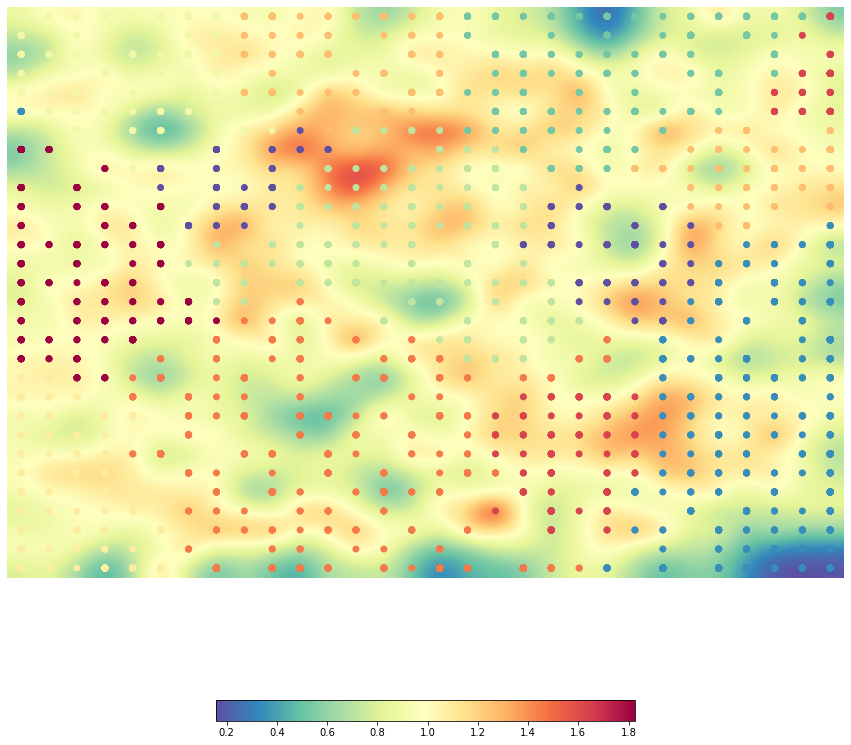

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som10.view_umatrix(bestmatches=True, colorbar=True, figsize=(15, 15))

In [ ]:
np.set_printoptions(threshold=100)
clusters = som10.clusters
cluster_analysis(clusters, 10)

[[4 4 4 ... 2 2 8]
 [4 4 4 ... 2 8 8]
 [4 4 4 ... 2 8 8]
 ...
 [5 5 5 ... 1 1 1]
 [5 5 5 ... 1 1 1]
 [5 5 5 ... 1 1 1]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[  5.   8.   0.   4.   9.   6.   2.   3.   1.   7.]
 [ 55.  59.  61.  63.  72.  84.  87. 115. 130. 174.]]


In [ ]:
analysis(10)

Cluster 7: (956 Total Movies)
[('Short Film', 164), ('Documentary', 125), ('Comedy film', 111), ('Animation', 90), ('Romance Film', 75), ('Science Fiction', 71), ('Japanese Movies', 71), ('Black-and-white', 64), ('Thriller', 63), ('Musical', 63), ('Silent film', 62), ('Adventure', 57), ('Western', 53), ('Fantasy', 51), ('Action/Adventure', 49), ('World cinema', 49), ('Bollywood', 29), ('War film', 28), ('Crime Fiction', 27), ('Indie', 24), ('Anime', 23), ('Drama', 19), ('Comedy-drama', 18), ('Chinese Movies', 18), ('Romantic comedy', 16), ('Biography', 15), ('Culture & Society', 13), ('Biographical film', 13), ("Children's/Family", 12), ('History', 12), ('Mystery', 11), ('Action', 11), ('Film noir', 10), ('Music', 10), ("Children's", 10), ('Sports', 10), ('Romantic drama', 9), ('Horror', 8), ('Political cinema', 8), ('Television movie', 8), ('Stop motion', 7), ('Comedy', 6), ('Surrealism', 6), ('Social issues', 6), ('Fantasy Adventure', 6), ('Filipino Movies', 6), ('Martial Arts Film',

##K = 15

In [ ]:
kmeans = KMeans(n_clusters = 15)
som10.cluster(algorithm = kmeans)

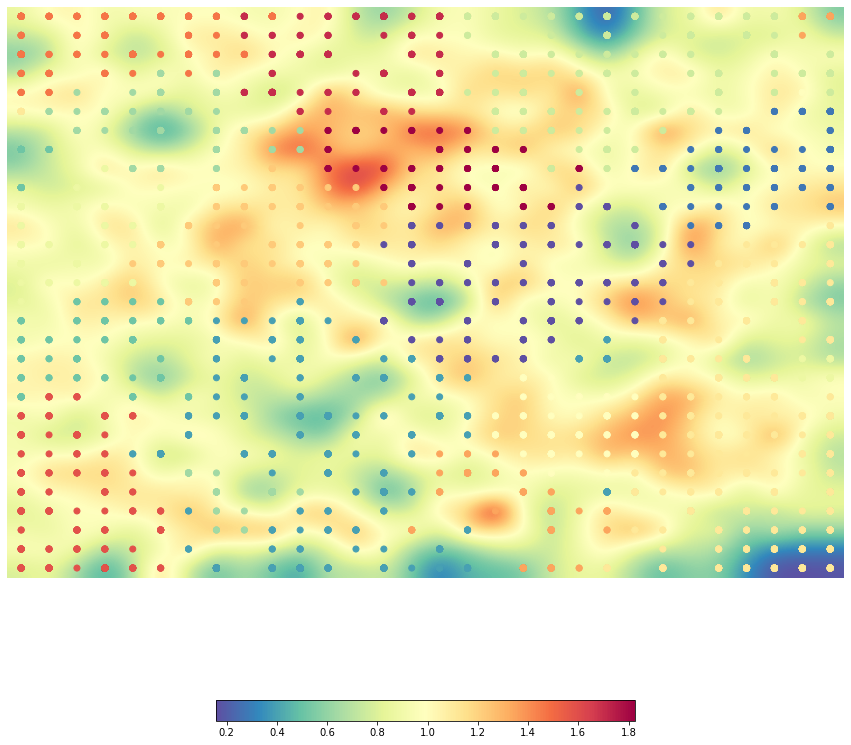

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som10.view_umatrix(bestmatches=True, colorbar=True, figsize=(15, 15))

In [ ]:
np.set_printoptions(threshold=100)
clusters = som10.clusters
cluster_analysis(clusters, 15)

[[11 11 11 ...  5 10 10]
 [11 11 11 ...  5 10 10]
 [11 11 11 ...  5  5  5]
 ...
 [12 12 12 ...  8  8  8]
 [12 12 12 ...  8  8  8]
 [12 12 12 ...  8  8  8]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[  7.  11.  14.   6.  10.   3.   1.  13.   4.  12.   9.   0.   5.   8.
    2.]
 [ 34.  34.  37.  38.  38.  42.  43.  44.  50.  52.  56.  83.  89. 127.
  133.]]


In [ ]:
analysis(15)

Cluster 2: (741 Total Movies)
[('Documentary', 123), ('Short Film', 114), ('Comedy film', 69), ('Japanese Movies', 60), ('Silent film', 58), ('Black-and-white', 57), ('Science Fiction', 55), ('Western', 54), ('Musical', 49), ('Action/Adventure', 44), ('World cinema', 40), ('Adventure', 36), ('Fantasy', 30), ('Bollywood', 29), ('War film', 27), ('Crime Fiction', 24), ('Indie', 21), ('Family Film', 19), ('Comedy-drama', 18), ('Anime', 17), ('Drama', 16), ('Biography', 15), ('Chinese Movies', 14), ('Romantic comedy', 14), ('Culture & Society', 13), ('Biographical film', 12), ('History', 12), ('Mystery', 11), ('Sports', 10), ('Music', 10), ('Film noir', 10), ("Children's/Family", 9), ('Animation', 9), ('Political cinema', 8), ('Romantic drama', 7), ('Social issues', 6), ('Historical fiction', 6), ('Surrealism', 6), ('Thriller', 6), ('Television movie', 6), ('Creature Film', 5), ('Filipino Movies', 5), ('Horror', 5), ('Monster', 4), ("Children's", 4), ('Avant-garde', 4), ('Spaghetti Western

##K = 20

In [ ]:
kmeans = KMeans(n_clusters = 20)
som10.cluster(algorithm = kmeans)

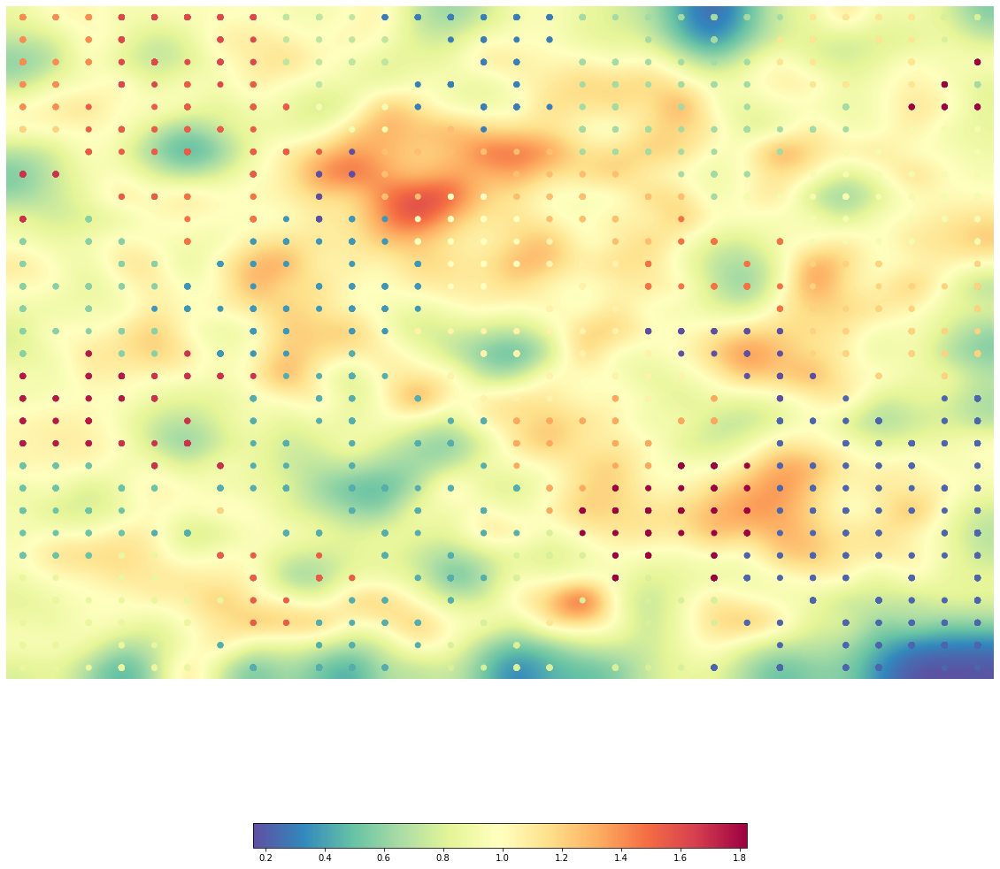

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som10.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

In [ ]:
np.set_printoptions(threshold=100)
clusters = som10.clusters
cluster_analysis(clusters, 20)

[[ 1  1  1 ...  0 10  0]
 [ 1  1  1 ...  0  0  0]
 [ 1  1  1 ...  0  0  0]
 ...
 [ 3  3  3 ...  2  2  2]
 [ 3  3  3 ...  2  2  2]
 [ 3  3  3 ...  2  2  2]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[ 11.   0.  15.   4.  12.  13.   8.  10.  19.   9.  16.   6.   7.  14.
    3.   1.  18.   5.   2.  17.]
 [ 17.  22.  23.  23.  26.  27.  27.  33.  36.  37.  39.  40.  42.  45.
   53.  70.  72.  80.  81. 107.]]


In [ ]:
analysis(20)

Cluster 17: (574 Total Movies)
[('Comedy film', 86), ('Romance Film', 73), ('Silent film', 56), ('Musical', 51), ('Thriller', 51), ('Black-and-white', 46), ('Japanese Movies', 45), ('Animation', 38), ('Adventure', 28), ('Fantasy', 23), ('Crime Fiction', 23), ('War film', 22), ('Bollywood', 20), ('Western', 20), ('Comedy-drama', 18), ('Family Film', 18), ('Chinese Movies', 16), ('Romantic comedy', 15), ('World cinema', 13), ('Anime', 11), ('Mystery', 10), ("Children's/Family", 9), ('Romantic drama', 9), ('Film noir', 8), ("Children's", 7), ('Biographical film', 6), ('Historical fiction', 5), ('Filipino Movies', 5), ('Indie', 5), ('Drama', 5), ('Pre-Code', 4), ('Period piece', 4), ('Spaghetti Western', 4), ('Spy', 4), ('Stop motion', 4), ('Crime Drama', 3), ('Historical drama', 3), ('Costume drama', 3), ('Coming of age', 3), ('Christmas movie', 3), ('Action/Adventure', 3), ('Wuxia', 3), ('Action', 3), ('Television movie', 3), ('Science Fiction', 3), ('Superhero movie', 3), ('Tamil cinema

##K = 25

In [ ]:
kmeans = KMeans(n_clusters = 25)
som10.cluster(algorithm = kmeans)

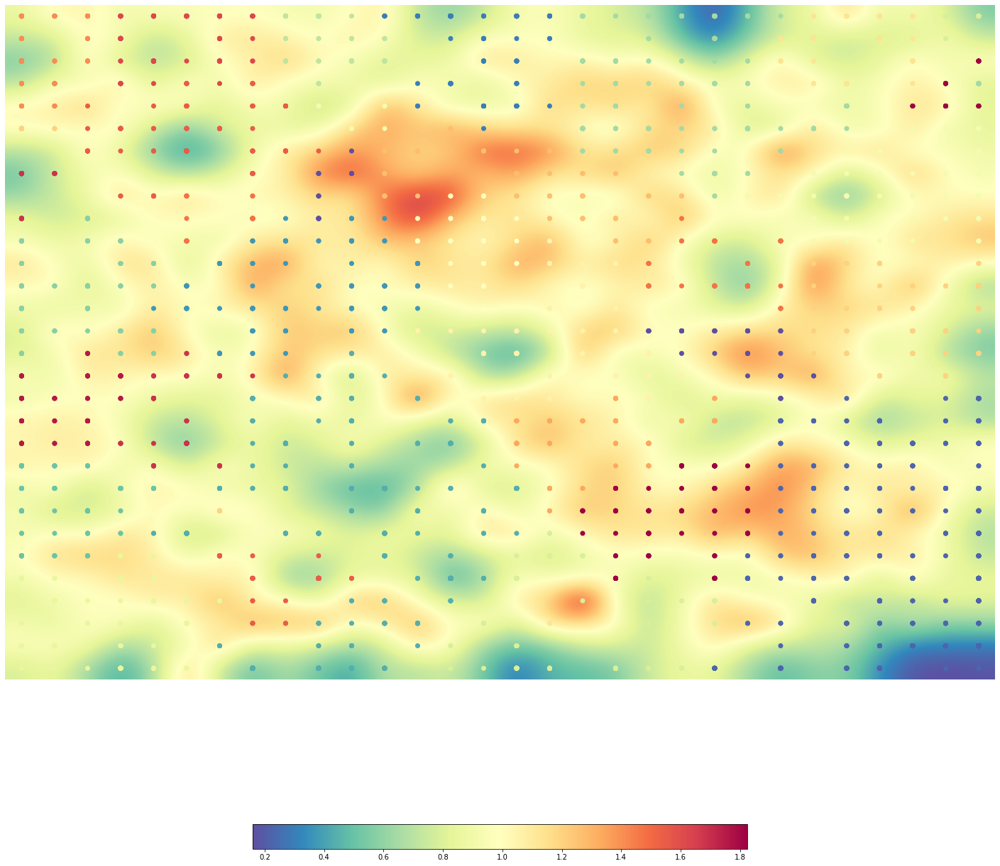

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som10.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

In [ ]:
np.set_printoptions(threshold=100)
clusters = som10.clusters
cluster_analysis(clusters, 25)

[[18 18 18 ... 14  9  9]
 [18 18 18 ... 14  9  9]
 [18 18 18 ... 14 14 24]
 ...
 [10 10 10 ...  1  1  1]
 [10 10 10 ...  1  1  1]
 [10 10 10 ...  1  1  1]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[ 18.  23.   8.  12.  21.   5.  14.   0.  19.   2.  22.  17.   6.  16.
   24.  10.  15.   9.  13.   3.  11.  20.   7.   1.   4.]
 [ 14.  16.  16.  17.  18.  20.  21.  25.  26.  26.  27.  28.  31.  31.
   32.  34.  38.  42.  42.  44.  44.  46.  60.  97. 105.]]


In [ ]:
analysis(25)

Cluster 4: (555 Total Movies)
[('Documentary', 103), ('Comedy film', 68), ('Silent film', 53), ('Western', 52), ('Japanese Movies', 46), ('Black-and-white', 46), ('Action/Adventure', 38), ('Musical', 38), ('Science Fiction', 26), ('War film', 22), ('Crime Fiction', 22), ('World cinema', 20), ('Bollywood', 20), ('Fantasy', 19), ('Comedy-drama', 17), ('Indie', 15), ('Biography', 15), ('Drama', 14), ('Romantic comedy', 13), ('Chinese Movies', 12), ('Culture & Society', 12), ('Anime', 11), ('Music', 10), ('Biographical film', 10), ('Mystery', 9), ('Film noir', 9), ('Sports', 8), ('Adventure', 8), ('History', 8), ('Romantic drama', 7), ('Political cinema', 7), ('Animation', 5), ('Filipino Movies', 5), ('Social issues', 5), ('Television movie', 5), ('Historical drama', 4), ('Rockumentary', 4), ('Family Film', 4), ('Spy', 4), ('Spaghetti Western', 4), ('Musical comedy', 3), ('Superhero movie', 3), ("Children's/Family", 3), ('Parody', 3), ('Illnesses & Disabilities', 3), ('Satire', 3), ('Histo

##Best K = 20 for SOM 10x10

Για την τιμή αυτή (Κ=20) παρατηρήσαμε ικανοποιητική ταξινόμηση στα  cluster. Παρότι, για Κ = 25 βρήκαμε μεγαλύτερο scoring, υπήρχε δημιουργία υποκατηγοριών που ήταν άσκοπη όπως romance film, romatnic drama.

##SOM 20x20

In [ ]:
bmus = som20.bmus
print(bmus.shape)
print(bmus)

(5000, 2)
[[13 19]
 [21 10]
 [19 26]
 ...
 [27 29]
 [11 27]
 [17 15]]


In [ ]:
np.set_printoptions(threshold=400)
ubmus, indices = np.unique(bmus, return_inverse=True, axis=0)
print(ubmus.shape)
print(ubmus)

(669, 2)
[[ 0  0]
 [ 0  1]
 [ 0  2]
 ...
 [29 27]
 [29 28]
 [29 29]]


In [ ]:
np.set_printoptions(threshold=400)
print(indices.shape)
print(indices)


(5000,)
[297 466 434 ... 617 263 382]


##K = 20

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 20)
som20.cluster(algorithm = kmeans)


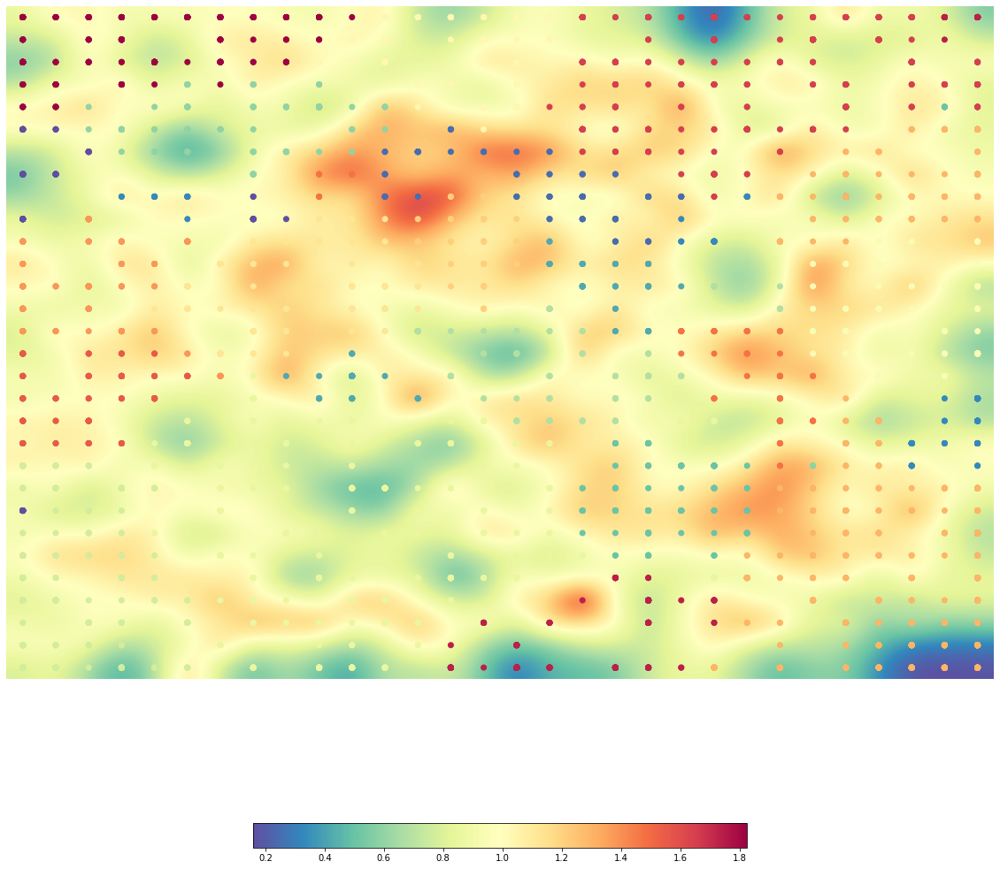

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som20.view_umatrix(bestmatches=True, colorbar=True, figsize=(20, 20))

In [ ]:
np.set_printoptions(threshold=400)
clusters = som20.clusters
cluster_analysis(clusters, 20)

[[19 19 19 ... 17 18 18]
 [19 19 19 ... 17 18 18]
 [19 19 19 ... 17 17 17]
 ...
 [ 7  7  7 ... 13 13 13]
 [ 7  7  7 ... 13 13 13]
 [ 7  7  7 ... 13 13 13]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[ 12.   0.   2.  16.   3.  15.   1.  14.  10.   4.   9.  18.  19.   5.
   11.   6.   7.  17.  13.   8.]
 [ 17.  18.  25.  26.  27.  28.  30.  31.  32.  34.  38.  38.  38.  39.
   43.  46.  52.  88. 114. 136.]]


In [ ]:
analysis(20)

Cluster 8: (743 Total Movies)
[('Documentary', 103), ('Comedy film', 88), ('Romance Film', 73), ('Thriller', 61), ('Musical', 60), ('Science Fiction', 59), ('Japanese Movies', 58), ('Silent film', 57), ('Black-and-white', 53), ('Animation', 42), ('World cinema', 40), ('Adventure', 34), ('Fantasy', 32), ('Bollywood', 29), ('Crime Fiction', 25), ('War film', 23), ('Western', 21), ('Family Film', 18), ('Comedy-drama', 18), ('Indie', 16), ('Chinese Movies', 16), ('Romantic comedy', 15), ('Anime', 15), ('Biography', 15), ('Culture & Society', 13), ('Mystery', 12), ('Music', 10), ('Biographical film', 10), ('Romantic drama', 9), ('Drama', 9), ('History', 9), ("Children's", 8), ('Sports', 8), ("Children's/Family", 8), ('Film noir', 8), ('Political cinema', 7), ('Historical fiction', 6), ('Television movie', 6), ('Social issues', 6), ('Filipino Movies', 5), ('Spy', 5), ('Creature Film', 5), ('Action/Adventure', 5), ('Historical drama', 4), ('Experimental film', 4), ('Avant-garde', 4), ('Martia

##K = 25

In [ ]:
kmeans = KMeans(n_clusters = 25)
som20.cluster(algorithm = kmeans)

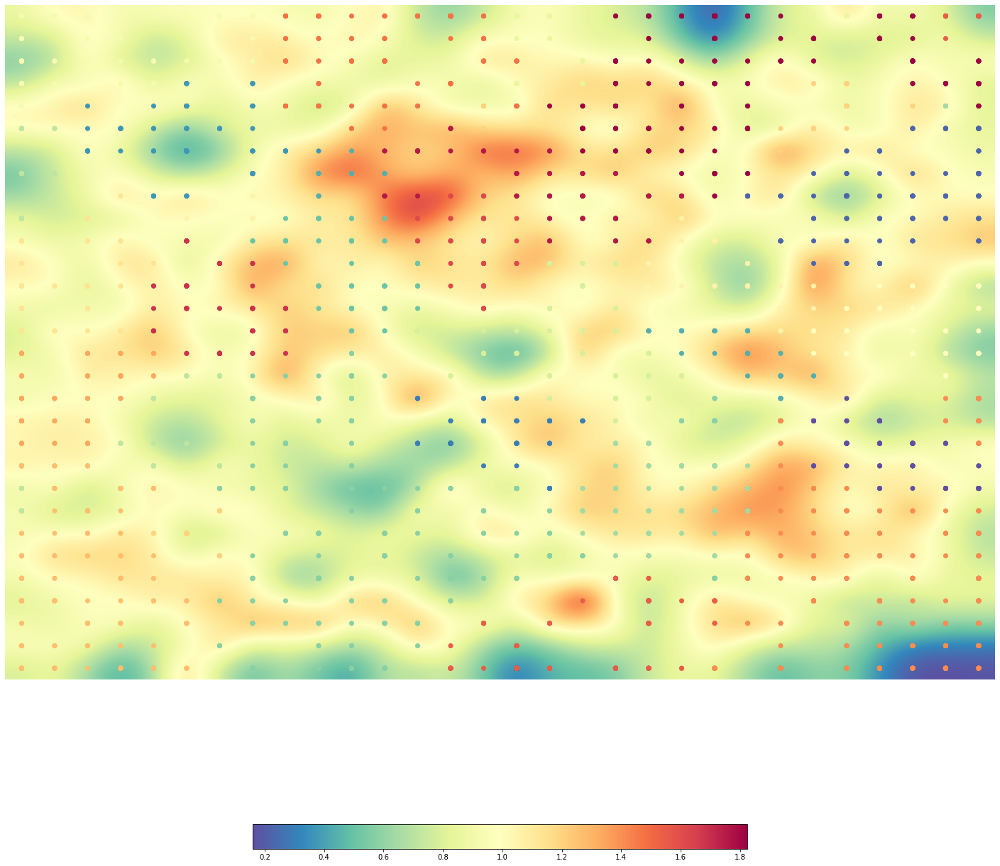

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som20.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

In [ ]:
np.set_printoptions(threshold=400)
clusters = som20.clusters
cluster_analysis(clusters, 25)

[[11 11 11 ... 24 20 20]
 [11 11 11 ... 24 20 20]
 [11 11 11 ... 24 24 24]
 ...
 [16 16 16 ... 18 18 18]
 [16 16 16 ... 18 18 18]
 [16 16 16 ... 18 18 18]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[ 10.  21.   2.  17.   0.   4.  22.  15.   5.   8.  14.  13.  12.  23.
   11.   3.   7.  20.  19.   9.   1.  16.  24.  18.   6.]
 [ 13.  17.  20.  21.  22.  23.  24.  24.  25.  26.  26.  28.  30.  31.
   32.  32.  33.  38.  39.  42.  42.  52.  65.  77. 118.]]


In [ ]:
analysis(25)

Cluster 6: (610 Total Movies)
[('Documentary', 103), ('Comedy film', 86), ('Romance Film', 60), ('Silent film', 56), ('Western', 53), ('Black-and-white', 48), ('Adventure', 38), ('Action/Adventure', 37), ('Animation', 37), ('Science Fiction', 34), ('Crime Fiction', 28), ('War film', 24), ('Bollywood', 20), ('World cinema', 19), ('Fantasy', 19), ('Family Film', 18), ('Comedy-drama', 17), ('Chinese Movies', 15), ('Biography', 15), ('Drama', 13), ('Romantic comedy', 13), ('Indie', 13), ('Mystery', 12), ('Culture & Society', 12), ('Biographical film', 11), ('Music', 10), ("Children's/Family", 9), ('Film noir', 9), ('Musical', 9), ('Romantic drama', 9), ('History', 8), ('Sports', 8), ('Political cinema', 7), ('Television movie', 7), ("Children's", 6), ('Historical fiction', 6), ('Filipino Movies', 5), ('Social issues', 5), ('Rockumentary', 4), ('Stop motion', 4), ('Spy', 4), ('Spaghetti Western', 4), ('Pre-Code', 4), ('Period piece', 4), ('Historical drama', 3), ('Wuxia', 3), ('Horror', 3),

##K = 30

In [ ]:
kmeans = KMeans(n_clusters = 30)
som20.cluster(algorithm = kmeans)

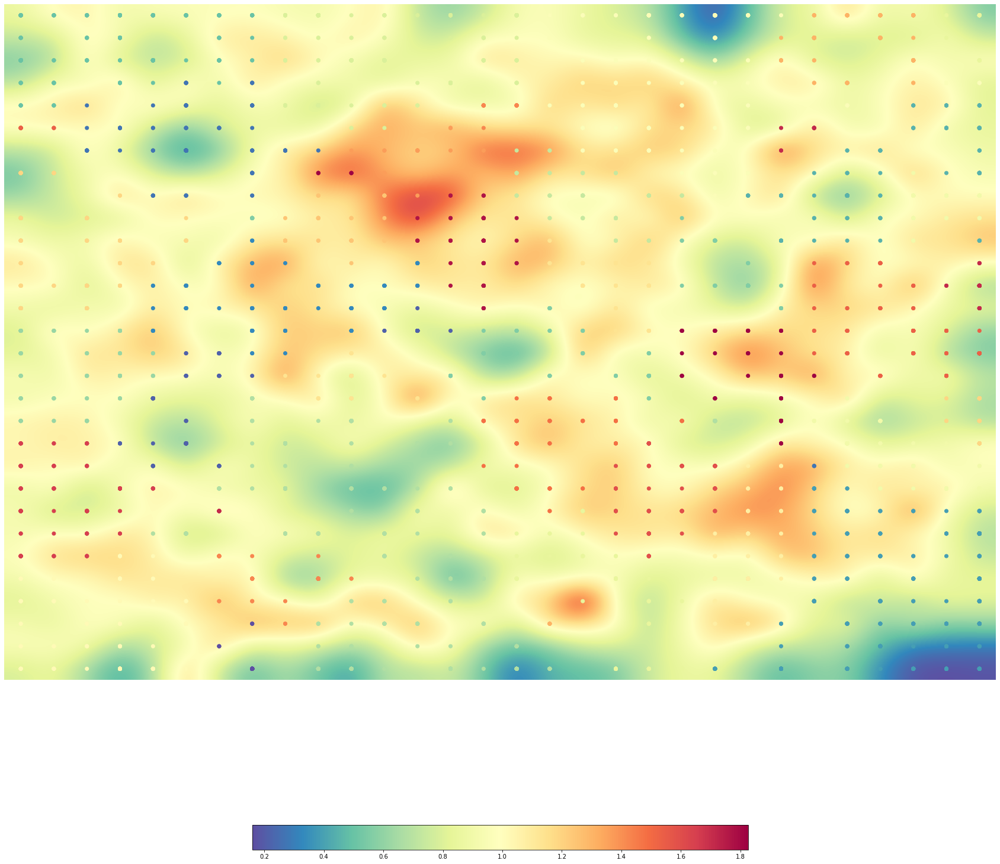

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som20.view_umatrix(bestmatches=True, colorbar=True, figsize=(30, 30))

In [ ]:
np.set_printoptions(threshold=400)
clusters = som20.clusters
cluster_analysis(clusters, 30)

[[ 6  6  6 ... 20 12 12]
 [ 6  6  6 ... 20 12 12]
 [ 6  6  6 ... 20 20 12]
 ...
 [15 15 15 ...  4  4  4]
 [15 15 15 ...  4  4  4]
 [15 15 15 ...  4  4  4]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[ 0. 27. 21. 19. 28. 25. 22. 10. 16.  8.  1. 26. 20. 23. 17. 29. 13.  6.
  24. 15. 12.  5.  3.  2. 18. 11.  7.  4. 14.  9.]
 [ 7. 11. 11. 13. 17. 20. 20. 20. 20. 22. 23. 23. 23. 25. 25. 25. 29. 32.
  32. 33. 34. 34. 35. 35. 39. 41. 42. 58. 61. 90.]]


In [ ]:
analysis(30)

Cluster 9: (567 Total Movies)
[('Documentary', 123), ('Short Film', 115), ('Comedy film', 73), ('Black-and-white', 41), ('Musical', 37), ('Japanese Movies', 37), ('War film', 23), ('Adventure', 22), ('Bollywood', 20), ('Crime Fiction', 20), ('Western', 19), ('Indie', 18), ('Comedy-drama', 17), ('Fantasy', 15), ('World cinema', 15), ('Biography', 15), ('Chinese Movies', 14), ('Romantic comedy', 14), ('Culture & Society', 12), ('Biographical film', 11), ('History', 11), ('Music', 10), ('Political cinema', 8), ('Sports', 8), ('Film noir', 8), ('Mystery', 8), ("Children's/Family", 8), ('Romantic drama', 7), ('Historical fiction', 5), ('Anime', 5), ('Filipino Movies', 5), ('Family Film', 5), ('Silent film', 5), ('Social issues', 5), ('Rockumentary', 4), ('Illnesses & Disabilities', 4), ('Pre-Code', 4), ('Spaghetti Western', 4), ('Period piece', 4), ('Drama', 4), ('Historical drama', 3), ('Fan film', 3), ('Crime Drama', 3), ('Coming of age', 3), ('Christian film', 3), ('Wuxia', 3), ('Thrille

##K = 35

In [ ]:
kmeans = KMeans(n_clusters = 35)
som20.cluster(algorithm = kmeans)

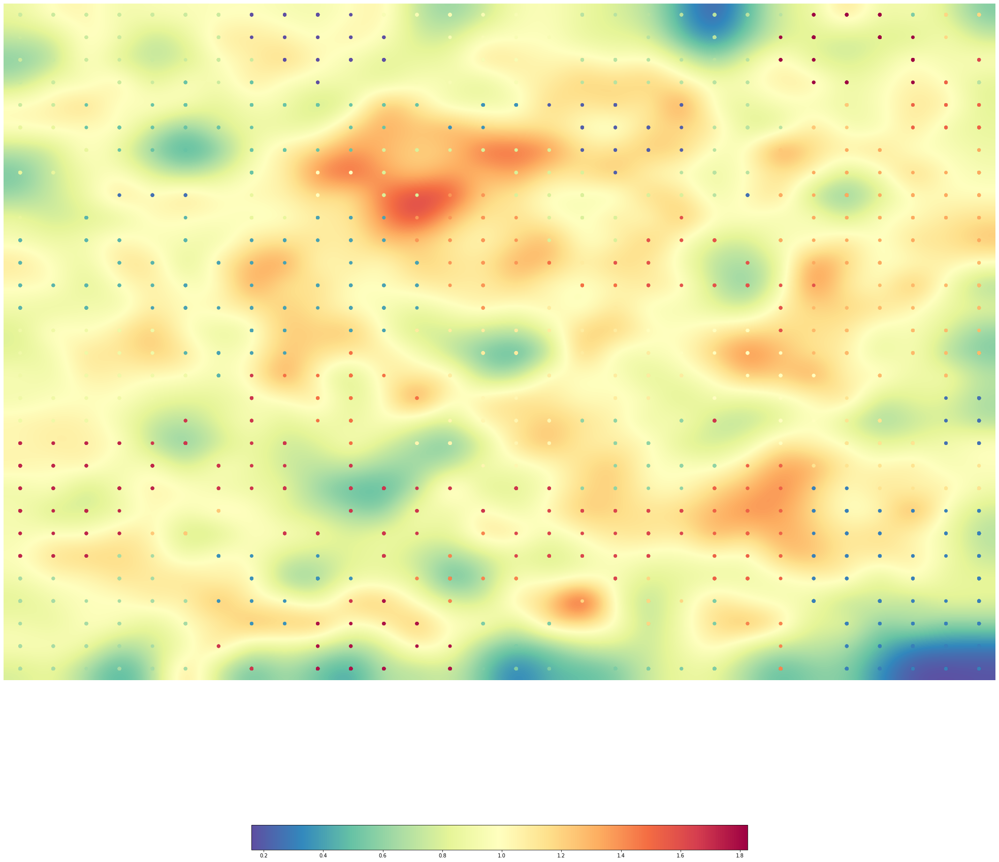

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som20.view_umatrix(bestmatches=True, colorbar=True, figsize=(35, 35))

In [ ]:
np.set_printoptions(threshold=100)
clusters = som20.clusters
cluster_analysis(clusters, 35)

[[12 12 12 ...  8 21 21]
 [12 12 12 ... 34 21 21]
 [12 12 12 ... 34 34 30]
 ...
 [10 10 10 ...  3  3  3]
 [10 10 10 ...  3  3  3]
 [10 10 10 ...  3  3  3]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[ 2. 21. 22. 33.  1. 18.  0. 25. 14. 26.  9. 16. 34. 20. 27.  4. 30.  8.
  29. 32. 15. 28. 17.  6. 13. 12. 23. 10. 19. 24.  7. 11.  5.  3. 31.]
 [12. 13. 14. 15. 16. 16. 17. 17. 17. 18. 18. 19. 19. 20. 20. 20. 22. 23.
  23. 25. 26. 26. 28. 28. 29. 30. 31. 33. 34. 36. 38. 40. 42. 52. 63.]]


In [ ]:
analysis(35)

Cluster 31: (324 Total Movies)
[('Silent film', 53), ('Thriller', 51), ('Black-and-white', 34), ('Science Fiction', 27), ('Bollywood', 20), ('Adventure', 19), ('War film', 18), ('Fantasy', 17), ('World cinema', 17), ('Comedy-drama', 16), ('Crime Fiction', 16), ('Chinese Movies', 14), ('Romantic comedy', 11), ('Film noir', 7), ('Mystery', 7), ('Romantic drama', 7), ('Biographical film', 5), ('Filipino Movies', 5), ('Spy', 5), ("Children's/Family", 4), ('Pre-Code', 4), ('Period piece', 4), ('Historical fiction', 4), ('Indie', 4), ('Wuxia', 3), ('Comedy film', 3), ('Satire', 3), ('Martial Arts Film', 3), ('Crime Drama', 3), ('Parody', 3), ('Political thriller', 3), ('Spaghetti Western', 3), ('Coming of age', 3), ('Surrealism', 3), ('Western', 3), ('Anime', 3), ('Suspense', 2), ('Fantasy Comedy', 2), ('Swashbuckler films', 2), ('Experimental film', 2), ('Avant-garde', 2), ('Docudrama', 2), ("Children's", 2), ('Detective', 2), ('Tamil cinema', 2), ('Biography', 2), ('Costume Adventure', 2),

##Best K = 30 for SOM 20x20

Έπειτα απο εξέταση των αποτελεσμάτων,  της analysis, βλέπουμε πως για μικες τιμές Κ, έχουμε πολλά κόκκινα cluster και για Κ=35 παρατηρούμε όπως και πριν κατηγορίες που ίσως δεν θα έπρεπε να διαχωριστούν.Ετσι, καταλήγουμε στο Κ= 30, για την καλύτερη τιμή και με το καλύτερο scoring.

##SOM 25x25

In [ ]:
bmus = som25.bmus
print(bmus.shape)
print(bmus)

(5000, 2)
[[13 19]
 [21 10]
 [19 26]
 ...
 [27 29]
 [11 27]
 [17 15]]


In [ ]:
np.set_printoptions(threshold=700)
ubmus, indices = np.unique(bmus, return_inverse=True, axis=0)
print(ubmus.shape)
print(ubmus)

(669, 2)
[[ 0  0]
 [ 0  1]
 [ 0  2]
 ...
 [29 27]
 [29 28]
 [29 29]]


In [ ]:
np.set_printoptions(threshold=700)
print(indices.shape)
print(indices)


(5000,)
[297 466 434 ... 617 263 382]


##K = 25

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 25)
som25.cluster(algorithm = kmeans)


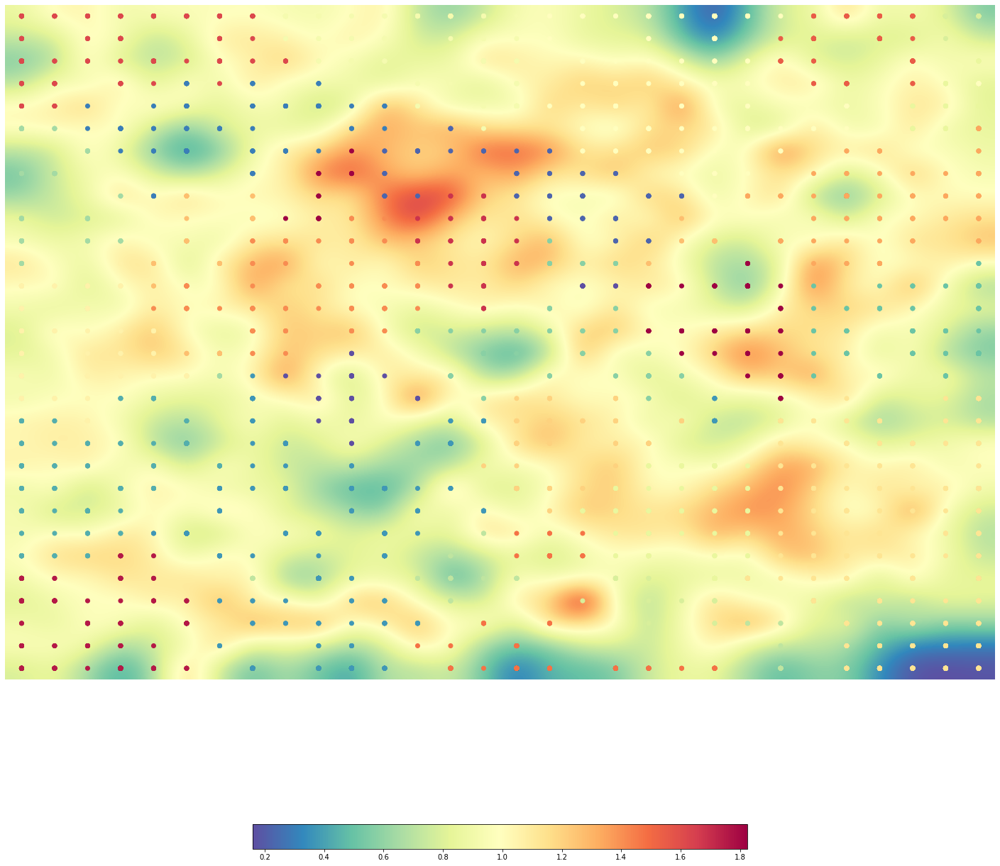

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 25)

[[21 21 21 ... 20  9  9]
 [21 21 21 ... 20  9  9]
 [21 21 21 ... 20 20 10]
 ...
 [23 23 23 ... 14 14 14]
 [23 23 23 ... 14 14 14]
 [23 23 23 ... 14 14 14]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[22.  0.  9.  8. 20.  7. 16. 15. 13.  1. 19. 21.  5. 23. 24. 11. 10.  6.  4.
   2. 18. 17. 12. 14.  3.]
 [17. 18. 18. 19. 20. 23. 24. 27. 30. 31. 32. 33. 33. 33. 34. 35. 35. 36. 38.
  38. 39. 40. 64. 88. 95.]]


In [ ]:
analysis(25)

Cluster 3: (504 Total Movies)
[('Documentary', 102), ('Romance Film', 62), ('Silent film', 55), ('Musical', 54), ('Black-and-white', 47), ('Japanese Movies', 44), ('Adventure', 29), ('Bollywood', 29), ('World cinema', 27), ('War film', 24), ('Crime Fiction', 22), ('Fantasy', 19), ('Comedy-drama', 18), ('Biography', 15), ('Chinese Movies', 15), ('Indie', 14), ('Romantic comedy', 13), ('Culture & Society', 12), ('Anime', 11), ('Biographical film', 10), ('Music', 9), ('Romantic drama', 9), ('History', 8), ('Film noir', 7), ('Political cinema', 7), ('Social issues', 6), ('Thriller', 6), ('Sports', 6), ('Mystery', 6), ('Filipino Movies', 5), ('Historical fiction', 5), ("Children's/Family", 5), ('Animation', 5), ('Period piece', 4), ('Pre-Code', 4), ('Historical drama', 4), ('Illnesses & Disabilities', 3), ('Crime Drama', 3), ('Costume drama', 3), ('Coming of age', 3), ('Comedy film', 3), ('Wuxia', 3), ('Action/Adventure', 3), ('Satire', 3), ('Spy', 3), ('Western', 3), ('Science Fiction', 3)

##K = 30

In [ ]:
kmeans = KMeans(n_clusters = 30)
som25.cluster(algorithm = kmeans)

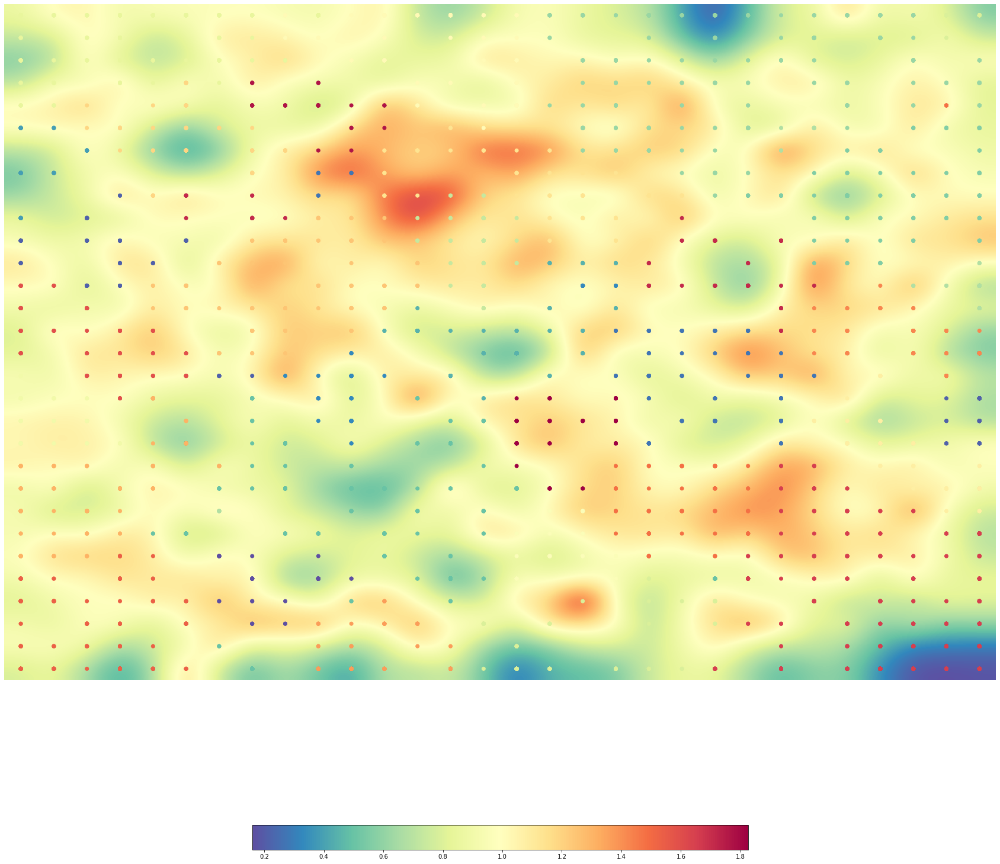

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(30, 30))

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 30)

[[12 12 12 ...  8 11 11]
 [12 12 12 ...  8 11 11]
 [12 12 12 ...  8  8  8]
 ...
 [24 24 24 ... 26 26 26]
 [24 24 24 ... 26 26 26]
 [24 24 24 ... 26 26 26]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[ 4. 13.  9. 14. 28.  0. 29.  3. 10. 21. 22. 25. 16. 23. 18.  1. 27. 20.  5.
  17. 24. 15. 12. 11.  2.  7. 19. 26.  6.  8.]
 [12. 13. 13. 14. 14. 15. 17. 17. 17. 17. 22. 23. 23. 25. 25. 27. 29. 29. 31.
  32. 33. 34. 34. 34. 38. 42. 43. 67. 76. 84.]]


In [ ]:
analysis(30)

Cluster 8: (505 Total Movies)
[('Comedy', 504), ('Black-and-white', 111), ('Short Film', 77), ('Family Film', 61), ('Parody', 55), ('Slapstick', 46), ('Black comedy', 45), ('Indie', 45), ('Musical', 33), ('World cinema', 25), ('Crime Fiction', 25), ('Satire', 24), ('Silent film', 22), ('Science Fiction', 20), ('Fantasy', 20), ('Horror', 19), ('Cult', 18), ('Adventure', 18), ('Sports', 14), ('Romantic comedy', 14), ('Animation', 12), ('Domestic Comedy', 12), ('Crime Comedy', 11), ("Children's/Family", 10), ('Fantasy Comedy', 10), ('Screwball comedy', 10), ('Sex comedy', 10), ('Teen', 10), ('Comedy of Errors', 9), ('Comedy-drama', 9), ('Horror Comedy', 8), ('Filipino Movies', 8), ('Chinese Movies', 8), ('Buddy film', 7), ('Political cinema', 7), ('Musical comedy', 6), ('Drama', 6), ('Ensemble Film', 6), ('Absurdism', 6), ('Comedy of manners', 6), ('Christmas movie', 6), ('Holiday Film', 6), ('Adventure Comedy', 6), ('Thriller', 6), ('Mystery', 5), ('Road movie', 5), ('Mockumentary', 5), 

##K = 35

In [ ]:
kmeans = KMeans(n_clusters = 35)
som25.cluster(algorithm = kmeans)

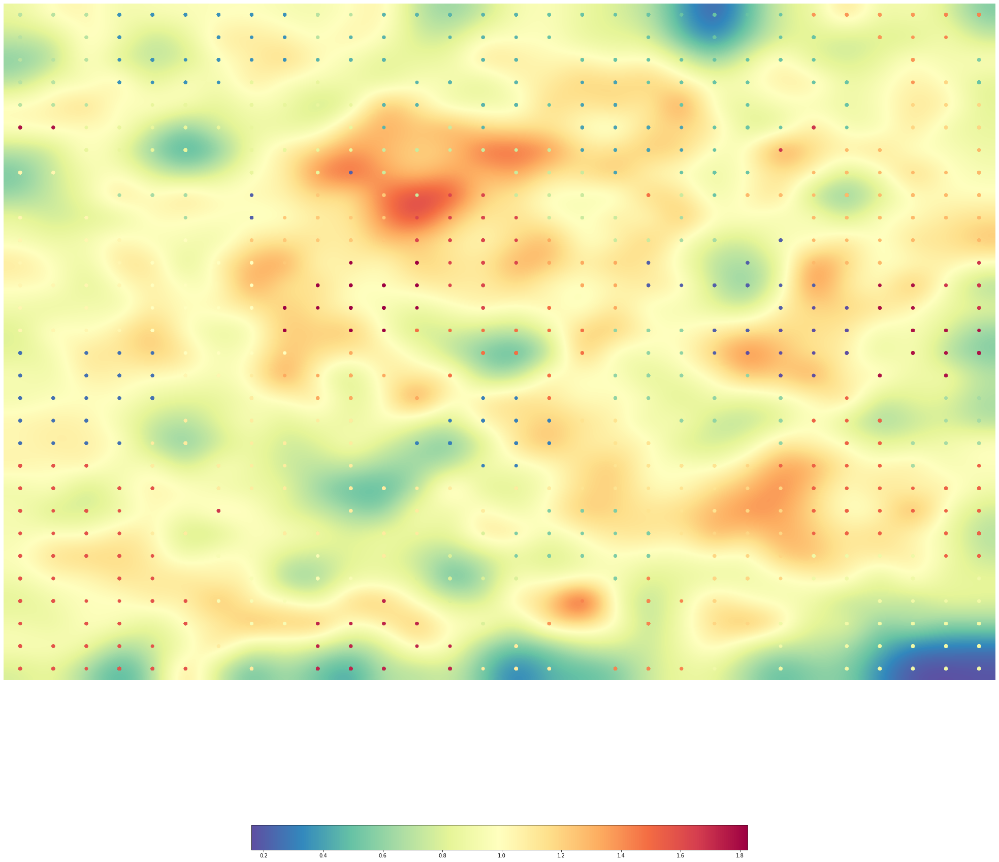

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(35, 35))

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 35)

[[11 11 11 ... 25 26 26]
 [11 11 11 ... 25 26 26]
 [11 11 11 ... 25 25  8]
 ...
 [29 29 29 ... 15 15 15]
 [29 29 29 ... 15 15 15]
 [29 29 29 ... 15 15 15]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[31.  0. 22. 32. 25. 16. 13.  3.  5. 30. 34. 11. 10.  8. 26. 20.  4. 24. 17.
  33.  9. 27.  2.  1. 21. 12.  6. 18. 23. 14. 28. 15. 29.  7. 19.]
 [10. 11. 14. 15. 15. 15. 15. 16. 16. 17. 17. 18. 18. 18. 20. 21. 22. 22. 22.
  22. 25. 25. 25. 26. 27. 27. 32. 35. 36. 36. 36. 42. 53. 54. 77.]]


In [ ]:
analysis(35)

Cluster 19: (452 Total Movies)
[('Short Film', 87), ('Thriller', 59), ('Silent film', 56), ('Black-and-white', 37), ('Science Fiction', 35), ('Musical', 33), ('Western', 22), ('Bollywood', 20), ('War film', 20), ('Fantasy', 19), ('World cinema', 17), ('Crime Fiction', 16), ('Comedy-drama', 16), ('Romantic comedy', 14), ('Chinese Movies', 14), ('Indie', 11), ('Film noir', 8), ('Mystery', 8), ('Romantic drama', 7), ('Biographical film', 7), ('Filipino Movies', 5), ('Spy', 5), ('Anime', 5), ('Parody', 4), ('Drama', 4), ("Children's/Family", 4), ('Spaghetti Western', 4), ('Fan film', 3), ('Pre-Code', 3), ('Historical drama', 3), ('History', 3), ('Hybrid Western', 3), ('Martial Arts Film', 3), ('Political thriller', 3), ('Japanese Movies', 3), ("Children's", 3), ('Comedy film', 3), ('Adventure', 3), ('Television movie', 3), ('Surrealism', 3), ('Christian film', 3), ('Satire', 3), ('Coming of age', 3), ('Crime Drama', 3), ('Family Drama', 2), ('Detective fiction', 2), ('Experimental film', 2

##K = 40

In [ ]:
kmeans = KMeans(n_clusters = 40)
som25.cluster(algorithm = kmeans)

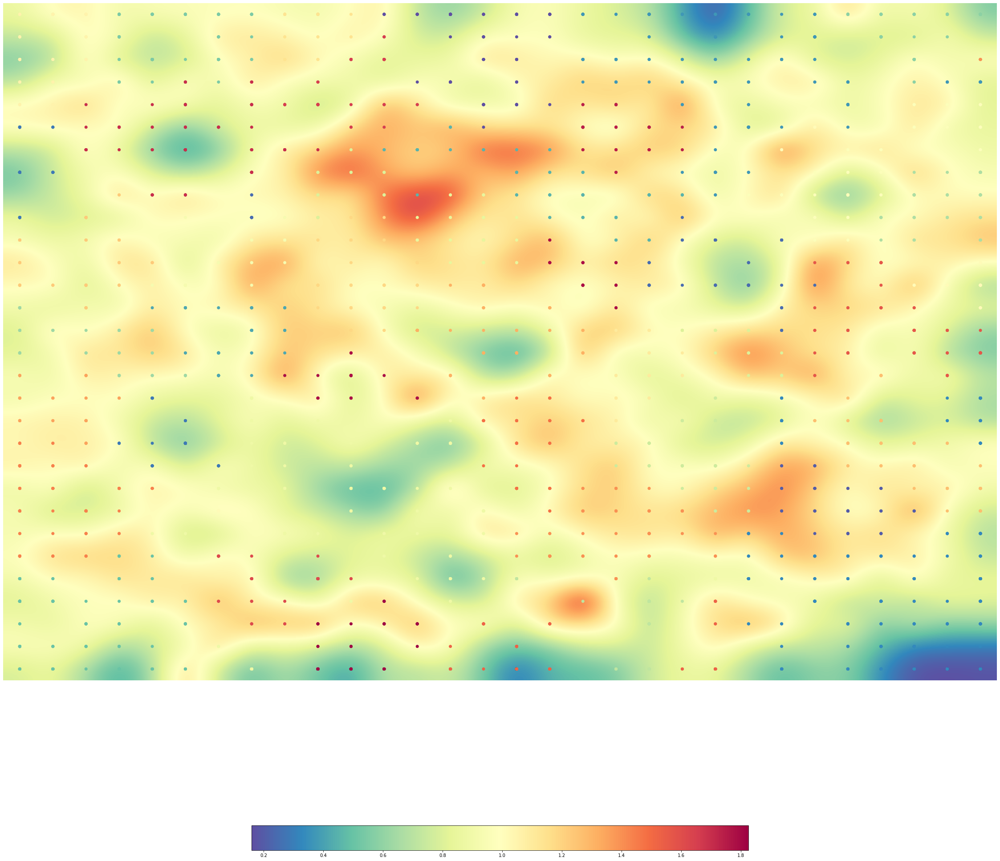

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som25.view_umatrix(bestmatches=True, colorbar=True, figsize=(40, 40))

In [ ]:
np.set_printoptions(threshold=650,linewidth=80)
clusters = som25.clusters
cluster_analysis(clusters, 40)

[[21 21 21 ... 10 10 10]
 [21 21 21 ... 10 10 10]
 [21 21 21 ... 10 10 29]
 ...
 [ 8  8  8 ...  4  4  4]
 [ 8  8  8 ...  4  4  4]
 [ 8  8  8 ...  4  4  4]] 

Clusters sorted by increasing number of neurons

Cluster index
Number of neurons

[[23. 28. 20. 22. 16. 21. 18. 12. 11. 10. 39. 37. 13.  1. 34.  6. 35. 31.  9.
  15. 38. 14.  3. 32. 24. 25. 30. 26.  0.  2. 29. 33. 27. 19.  7. 36.  8.  5.
   4. 17.]
 [ 8. 12. 12. 13. 13. 14. 14. 14. 14. 14. 14. 14. 15. 15. 15. 15. 16. 17. 18.
  19. 20. 21. 21. 21. 21. 22. 22. 23. 25. 25. 26. 27. 27. 27. 28. 32. 33. 55.
  61. 77.]]


In [ ]:
analysis(40)

Cluster 17: (399 Total Movies)
[('Comedy film', 66), ('Silent film', 53), ('Musical', 38), ('Black-and-white', 37), ('Japanese Movies', 35), ('Bollywood', 20), ('Western', 20), ('War film', 19), ('Family Film', 18), ('Crime Fiction', 18), ('Comedy-drama', 17), ('Fantasy', 15), ('Romantic comedy', 13), ('Chinese Movies', 12), ('World cinema', 10), ('Mystery', 9), ('Film noir', 8), ('Romantic drama', 7), ('Filipino Movies', 5), ('Biographical film', 5), ('Spaghetti Western', 4), ('Indie', 4), ('Crime Drama', 3), ('Coming of age', 3), ('Science Fiction', 3), ('Satire', 3), ('Historical fiction', 3), ("Children's/Family", 3), ('Drama', 3), ('Historical drama', 3), ('Pre-Code', 3), ('Anime', 3), ('Spy', 3), ('History', 2), ('Hybrid Western', 2), ('Wuxia', 2), ('Family Drama', 2), ('Detective fiction', 2), ('Martial Arts Film', 2), ('Christmas movie', 2), ('Christian film', 2), ("Children's", 2), ('Black comedy', 2), ('Biography', 2), ('Detective', 2), ('Adventure', 2), ('Period piece', 2), 

##Best K = 30 for SOM 25x25

Εδώ παρότι για Κ = 30 δεν έχουμε το βέλτιστο scoring παρατηρούμε ότι έχουμε καλά clusters καλό διαχωρισμό κατηγοριών. Το αντίθετο παρατηρούμε για μικρές τιμές του K, ενώ για Κ = 40 ενώ είχαμε το μεγαλύτερο scoring, έχουμε το πρόνλημα που έχουμε αναφέρει και προηγουμένως.

##SOM 30x30

In [ ]:
bmus = som30.bmus
print(bmus.shape)
print(bmus)

(5000, 2)
[[13 19]
 [21 10]
 [19 26]
 ...
 [27 29]
 [11 27]
 [17 15]]


In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
ubmus, indices = np.unique(bmus, return_inverse=True, axis=0)
print(ubmus.shape)
print(ubmus)

(669, 2)
[[ 0  0]
 [ 0  1]
 [ 0  2]
 ...
 [29 27]
 [29 28]
 [29 29]]


In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
print(indices.shape)
print(indices)


(5000,)
[297 466 434 ... 617 263 382]


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 25)
som30.cluster(algorithm = kmeans)


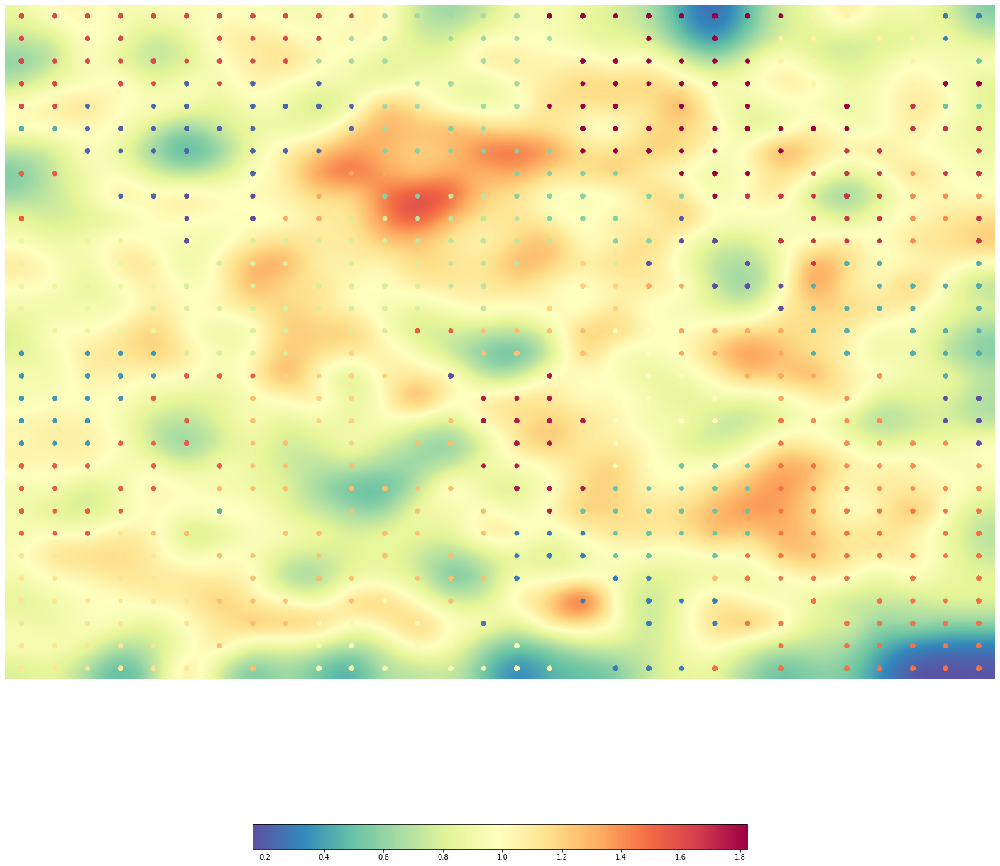

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(25, 25))

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 25)

[[21 21 21 21 21 21 21 21 21 21 21  7  7  7  7  7 24 24 24 24 24 24 24 24 13 13 13 13  2  2]
 [21 21 21 21 21 21 21 21 21 21  7  7  7  7  7  7  7 24 24 24 24 24 24 13 13 13 13 13  2  2]
 [21 21 21 21 21 21 21 21 21  7  7  7  7  7  7  7 24 24 24 24 24 24 24 13 13 13 13 13 13  5]
 [21 21 21 21 21  1 21  1  1  1  7  7  7  7  7  7 24 24 24 24 24 24 24 13 13 13 13 13 24 24]
 [21 21  1  1  1  1  1  1  1  1  1  7  7  7  7  7 24 24 24 24 24 24 24 24 24 24 24 22  5  5]
 [ 4  4  1  1  1  1  1  1  1  1  1  7  6  6  7  7 24 24 24 24 24 24 24 24 24 24 22 22 22 22]
 [20 20  1  1  1  1  1  1  1  1 17  6  6  6  6  6  6 24 24 24 24 24 24 24 24 22 22 22 22 22]
 [20 20 20  1  1  1  1  1  1 17 17 17  6  6  6  6  6  6  6 24 24 24 24 22 22 22 22 18 22 22]
 [20 20 10  1  1  0  0  0 17 17 17  6  6  8  8  6  6  6  6  6  6 24 22 22 22 22 22 18 18 18]
 [20 10 10 10  0  0  0  0 17 17  9  9  8  8  8  8  6  6  6  6  0  0 22 22 22 22 22 18 18 22]
 [10 10 10 10 10  0  9  9  9  9  9  9  8  8  8  8  8  6  6  6  0  0  0

In [ ]:
analysis(25)

Cluster 16: (521 Total Movies)
[('Comedy film', 78), ('Romance Film', 74), ('Action', 70), ('Silent film', 56), ('Musical', 51), ('Black-and-white', 42), ('Japanese Movies', 36), ('War film', 23), ('Bollywood', 21), ('Crime Fiction', 21), ('Family Film', 20), ('Fantasy', 19), ('Comedy-drama', 18), ('Romantic comedy', 15), ('Chinese Movies', 14), ('Mystery', 13), ('World cinema', 11), ('Film noir', 9), ('Romantic drama', 9), ('Spy', 8), ('Biographical film', 6), ('Filipino Movies', 5), ('Indie', 5), ('Adventure', 4), ('Detective', 4), ('Detective fiction', 3), ('Historical fiction', 3), ('Historical drama', 3), ('Psychological thriller', 3), ('Pre-Code', 3), ('Thriller', 3), ('Crime Drama', 3), ('Coming of age', 3), ('Tamil cinema', 3), ('Spaghetti Western', 3), ("Children's/Family", 3), ('Superhero movie', 3), ('Satire', 3), ('Anime', 3), ('Biography', 2), ('Horror', 2), ('History', 2), ('Action Thrillers', 2), ('Costume drama', 2), ('Black comedy', 2), ('Christian film', 2), ('Family 

##K = 30

In [ ]:
kmeans = KMeans(n_clusters = 30)
som30.cluster(algorithm = kmeans)

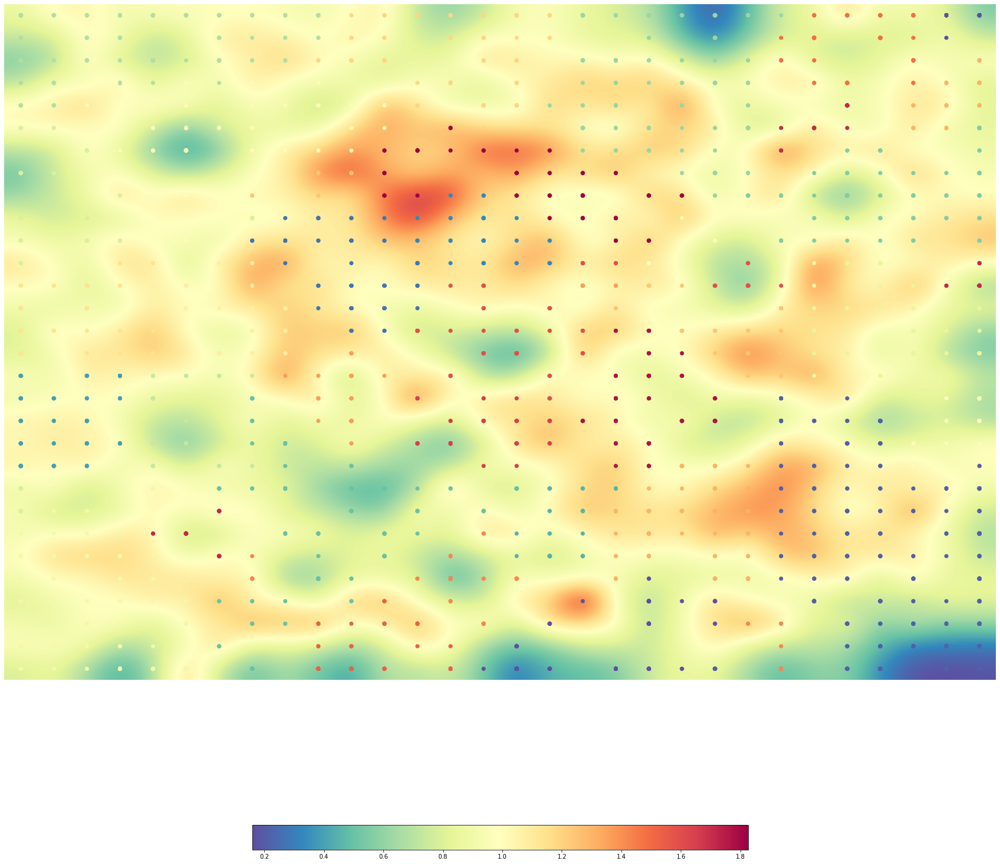

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(30, 30))

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 30)

[[ 9  9  9  9  9  9  9  9  9  9 18 18 18 18 18 18 18  8  8  8  8  8  8  8 23 23 23 23  0  0]
 [ 9  9  9  9  9  9  9  9  9  9 18 18 18 18 18 18 18  8  8  8  8  8  8 23 23 23 23 23  0  0]
 [ 9  9  9  9  9  9  9  9  9 18 18 18 18 18 18 18  8  8  8  8  8  8  8 23 23 23 23 23 23 20]
 [ 9  9  9  9  9 15  9 15 15 15 18 18 18 18 18 18  8  8  8  8  8  8  8 23 23 23 23 23 20 20]
 [ 9  9 15 15 15 15 15 15 15 15 15 15 18 18 18 18  8  8  8  8  8  8  8  8 27 27 27 20 20 20]
 [11 11 15 15 15 15 15 15 15 15 15 15 29 29 18 18  8  8  8  8  8  8  8 27 27 27  7 20 20  7]
 [11 11 11 15 15 15 15 15 15 15 15 29 29 29 29 29 29  8  8  8  8  8  8 27 27  7  7  7  7  7]
 [11 11 11 15 15 15 15 15 15 19 19 29 29 29 29 29 29 29 29  8  8  8  8  7  7  7  7  7  7  7]
 [11 11 11 11 14 14 14 19 19 19 19 29 29  3  3 29 29 29 29 29 29  8  7  7  7  7  7  7  7  7]
 [11 11 11 11 14 14 11 11  2  2  2  2  3  3  3  3 29 29 29 29 14 14 14  7  7  7  7  7  7  7]
 [11 11 11 11 14 14 16  2  2  2  2  2  3  3  3  3  3 29 29 29 14 14 14

In [ ]:
analysis(30)

Cluster 1: (796 Total Movies)
[('Drama', 788), ('Black-and-white', 104), ('Indie', 87), ('Period piece', 57), ('War film', 51), ('Silent film', 47), ('Film adaptation', 37), ('Biographical film', 34), ('Adventure', 32), ('Biopic [feature]', 32), ('Musical', 29), ('Family Drama', 29), ('Short Film', 29), ('Melodrama', 28), ('Biography', 28), ('Coming of age', 25), ('Television movie', 21), ('Political drama', 19), ('Science Fiction', 18), ('Sports', 18), ('Comedy-drama', 16), ('Docudrama', 16), ('Romance Film', 13), ('Family Film', 13), ('Japanese Movies', 11), ('History', 10), ('Romantic drama', 9), ('Chinese Movies', 9), ('Musical Drama', 9), ('Mystery', 9), ('Art film', 8), ('Crime Fiction', 8), ('Horror', 7), ('Film noir', 7), ('Music', 7), ('Prison', 7), ('Western', 6), ('Ensemble Film', 6), ('Fantasy', 6), ('Teen', 6), ('Courtroom Drama', 6), ('Costume drama', 6), ('Historical fiction', 6), ('Childhood Drama', 5), ('Crime Drama', 5), ('Americana', 4), ('Satire', 4), ('Documentary'

##K = 35

In [ ]:
kmeans = KMeans(n_clusters = 35)
som30.cluster(algorithm = kmeans)

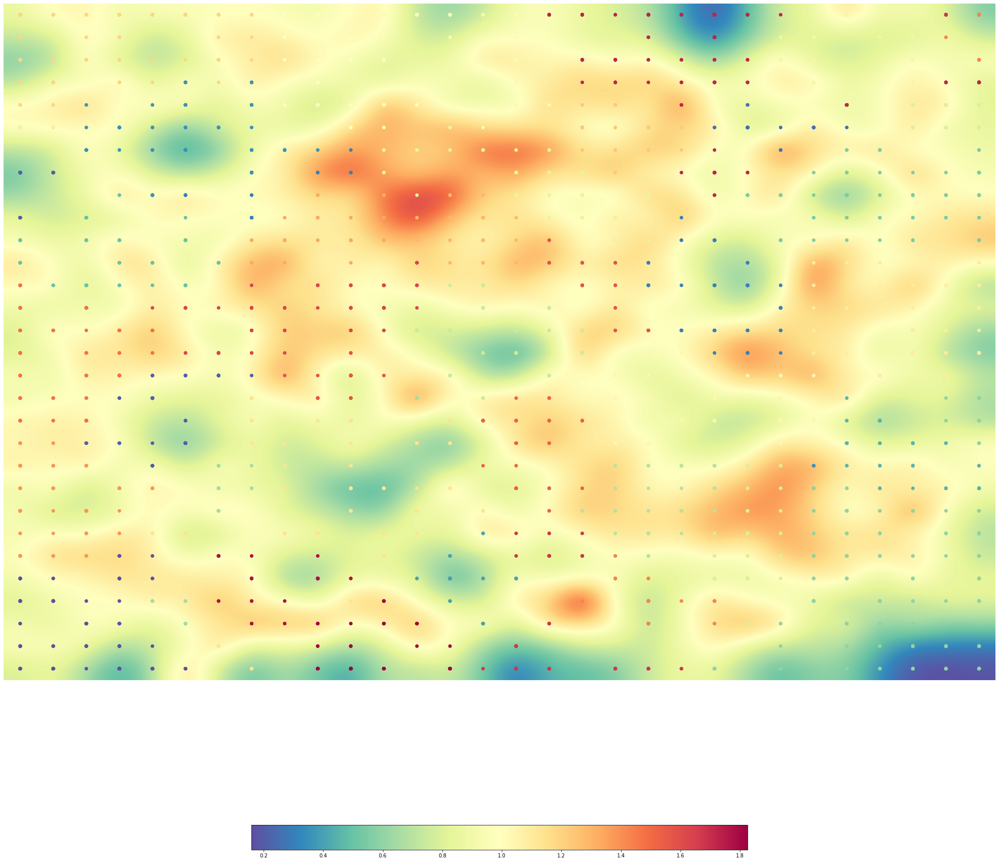

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(35, 35))

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 35)

[[21 21 21 21 21 21 21 21 17 17 17 16 16 16 16 16 32 32 32 32 32 32 32 32 15 15 15 15 31 26]
 [21 21 21 21 21 21 21 21 17 17 17 17 16 16 16 16 16 32 32 32 32 32 32 15 15 15 15 15 26 26]
 [21 21 21 21 21 21 21 21 17 17 17 17 17 16 16 16 32 32 32 32 32 32 32 15 15 15 15 15 15 26]
 [21 21 21 21 21  4 21  4 17 17 17 17 16 16 16 16 16 32 32 32 32 32 32 15 15 15 15 15 32 32]
 [21 21  4  4  4  4  4  4 17 17 17 17 17 16 16 16 16 22 22 22 32 32  2  2  2 32 32 13 13 13]
 [19 19  4  4  4  4  4  4  4 17 17 17 14 14 16 16 22 22 22 22 22  2  2  2  2  2  8 13 13 13]
 [ 1  1  4  4  4  4  4  4  4  4  3 14 14 14 14 14 14 22 22 22 22 32  2  2  2  8  8  8 13  8]
 [ 1  1  1  4  4  4  4  4  4  3  3 14 14 14 14 14 14 14 22 22 32 32 32  8  8  8  8  8  8  8]
 [ 1  1  7  7  4  3  3  3  3 24 24 24 14 23 23 14 14 14 14 14 14 32  8  8  8  8  8  8  8  8]
 [ 1  1  7  7  4  7  3  3 24 24 24 24 23 23 23 23 14 14 14 14  3  3  8  8  8  8  8  8  8  8]
 [ 7  7  7  7  7  7  7 24 24 24 24 24 23 23 23 23 29 14 14 14  3  3  3

In [ ]:
analysis(35)

Cluster 9: (771 Total Movies)
[('Drama', 771), ('Black-and-white', 78), ('Crime Fiction', 64), ('War film', 47), ('Period piece', 42), ('Comedy film', 37), ('Biographical film', 31), ('Biopic [feature]', 31), ('Melodrama', 28), ('Biography', 27), ('Musical', 27), ('Film adaptation', 24), ('Television movie', 22), ('Silent film', 21), ('Short Film', 20), ('Mystery', 16), ('Political drama', 16), ('Sports', 16), ('Docudrama', 15), ('Family Drama', 14), ('Coming of age', 14), ('Film noir', 13), ('Science Fiction', 11), ('Crime Drama', 11), ('Romantic drama', 10), ('Japanese Movies', 10), ('Courtroom Drama', 9), ('Chinese Movies', 9), ('Art film', 8), ('History', 8), ('Prison', 8), ('Music', 7), ('Fantasy', 6), ('Comedy-drama', 6), ('Historical fiction', 6), ('Horror', 6), ('Gangster Film', 6), ('Musical Drama', 5), ('Filipino Movies', 5), ('Family Film', 4), ('Adventure', 4), ('Marriage Drama', 4), ('Social problem film', 4), ('Bollywood', 4), ('Medical fiction', 4), ('Pre-Code', 4), ('Do

##K = 40

In [ ]:
kmeans = KMeans(n_clusters = 40)
som30.cluster(algorithm = kmeans)

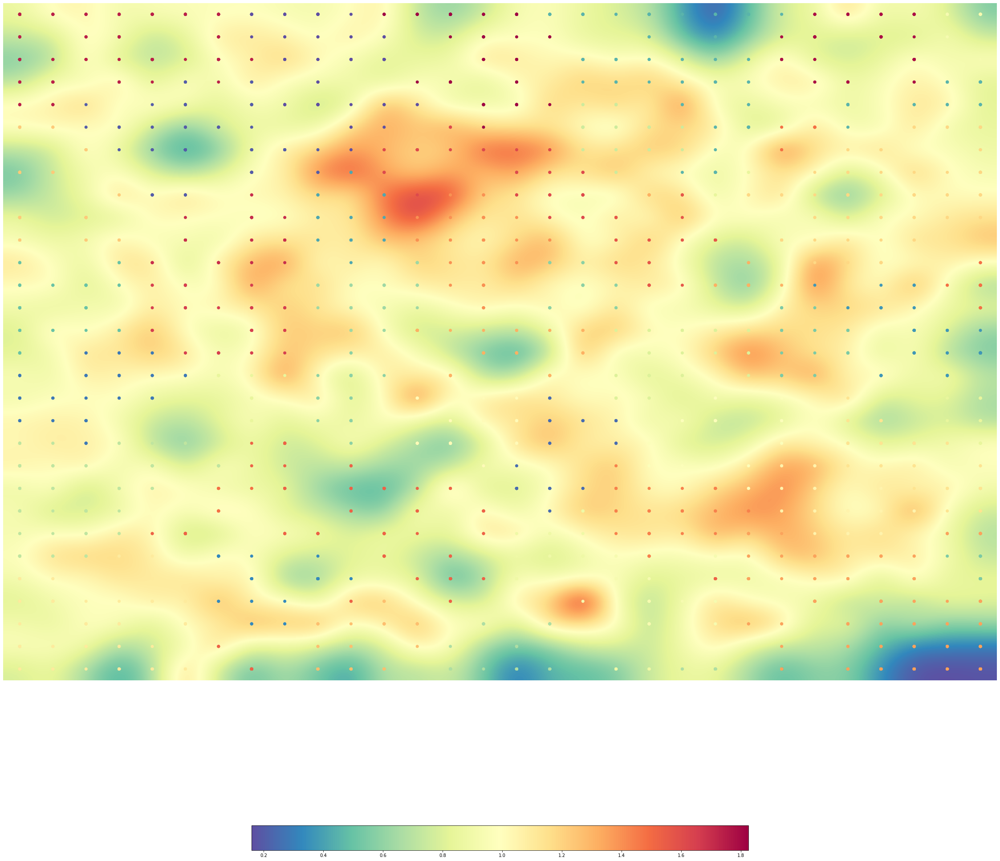

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(40, 40))

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 40)

[[37 37 37 37 37 37 37  0  0  0  0 39 39 39 39 39  7  7  7  7  7  7  7  7 38 38 38 38 18 18]
 [37 37 37 37 37 37 37  0  0  0  0  0 39 39 39 39 39  7  7  7  7  7  7 38 38 38 38 38 18 18]
 [37 37 37 37 37 37 37 37  0  0  0  0  0 39 39 39  7  7  7  7  7  7  7 38 38 38 38 38 38 18]
 [37 37 37 37 37  1 37  1  0  0  0  0 39 39 39 39 39  7  7  7  7  7  7 38 38 38 38 38  7  7]
 [37 37  1  1  1  1  1  1  0  0  0  0  0 39 39 39 39 14 14 14  7  7  7  7  7  7  7  7  7  7]
 [25 25  1  1  1  1  1  1  1  0  0  0 34 34 39 39 14 14 14 14 14  7  7 31 31  7 24 24 24 24]
 [25 25 25  1  1  1  1  1  1  1  0 34 34 34 34 34 34 14 14 14 14  7  7 31 31 24 24 24 24 24]
 [25 25 25  1  1  1  1  1  1  1  6 34 34 34 34 34 34 34 14 14  7  7 16 24 24 24 24 24 24 24]
 [25 25 25 25  1  1 36 36 36  6  6  6 34 29 29 34 34 34 34 27 33 16 24 24 24 24 24 24 24 24]
 [25 25 25 25  1 36 36 36 36  6  6  6 29 29 29 29 34 34 33 33 33 33 24 24 24 24 24 24 24 24]
 [25 25 25 25 36 36 36 36 36  6  6  6 29 29 29 29 29 34 33 33 33 33 33

In [ ]:
analysis(40)

Cluster 32: (322 Total Movies)
[('Comedy film', 66), ('Silent film', 53), ('Musical', 38), ('Black-and-white', 28), ('War film', 19), ('Bollywood', 18), ('Family Film', 18), ('Comedy-drama', 16), ('Fantasy', 14), ('Romantic comedy', 13), ('Chinese Movies', 12), ('Romantic drama', 7), ('Mystery', 5), ('Biographical film', 5), ('Film noir', 5), ('Filipino Movies', 5), ('Indie', 4), ("Children's/Family", 3), ('Satire', 3), ('Pre-Code', 3), ('Coming of age', 3), ('Spaghetti Western', 3), ('Spy', 3), ('Crime Fiction', 3), ('Historical fiction', 3), ('Historical drama', 3), ('Anime', 3), ('Musical comedy', 2), ('Parody', 2), ('History', 2), ('Christmas movie', 2), ('Wuxia', 2), ('Period piece', 2), ('Surrealism', 2), ('Western', 2), ('Thriller', 2), ('Television movie', 2), ('Tamil cinema', 2), ('Psychological thriller', 2), ('Family Drama', 2), ('Biography', 2), ('Black comedy', 2), ("Children's", 2), ('Christian film', 2), ('Crime Drama', 1), ('Culture & Society', 1), ('Dance', 1), ('Auto 

##K = 45

In [ ]:
kmeans = KMeans(n_clusters = 45)
som30.cluster(algorithm = kmeans)

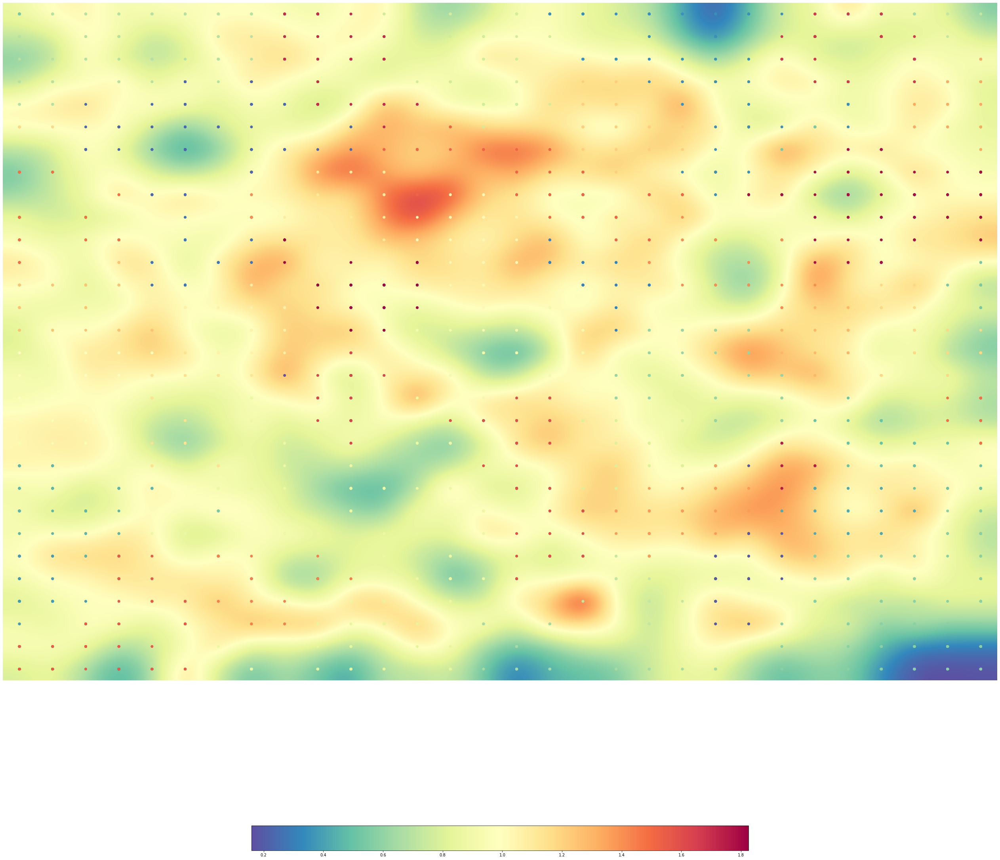

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.7/dist-packages/matplotlib/pyplot.py'>

In [ ]:
som30.view_umatrix(bestmatches=True, colorbar=True, figsize=(45, 45))

In [ ]:
np.set_printoptions(threshold=1000,linewidth=100)
clusters = som30.clusters
cluster_analysis(clusters, 45)

[[10 14 14 14 14 14 14 14 41 41 41 16 16 16 16 16  5  5  5  5  5  5  5  5 40 40 40 13 15 15]
 [14 14 14 14 14 14 14 14 41 41 41 41 16 16 16 16 16  5  5  5  5  5  5 40 40 40 40 40 15 15]
 [14 14 14 14 14 14 14 14 41 41 41 41 41 16 16 16  5  5  5  5  5  5  5 40 40 40 40 40 40 31]
 [14 14 14 14 14  2 14  2 41 41 41 41 16 16 16 16 16 28 28  5  5  5  5 40 40 40 40 40 31 31]
 [14 14  2  2  2  2  2  2  2 41 41 41 41 16 16 16 16 28 28 28  5  5  5  5  5  5  5 31 31 31]
 [27 27  2  2  2  2  2  2  2  2  2 41 36 36 16 16 28 28 28 28 28  5  5  5 10  5 31 31 31 31]
 [35 35  2  2  2  2  2  2  2  2  2 36 36 36 36 36 36 28 28 28 28  5  5 10 10 43 43 31 31 31]
 [35 35 35  2  2  2  2  2  2 25 25 25 36 36 36 36 36 36 28 28  5  5  5 43 43 43 43 43 43 43]
 [35 35 35 35  2  2 33 33 25 25 25 25 36 23 23 36 36 36 36 36 36  5 43 43 43 43 43 43 43 43]
 [35 35 35 35 35  3 33 33 25 25 25 25 23 23 23 23 36 36 36 36 33 33 43 43 43 43 43 43 43 43]
 [35 35 35 35  3  3  3  3 44 25 25 25 23 23 23 23  4  4 36 36 33 33 33

In [ ]:
analysis(45)

Cluster 19: (369 Total Movies)
[('Comedy film', 66), ('Silent film', 53), ('Musical', 36), ('Black-and-white', 36), ('Japanese Movies', 35), ('Bollywood', 20), ('War film', 19), ('Crime Fiction', 18), ('Comedy-drama', 17), ('Fantasy', 15), ('World cinema', 14), ('Romantic comedy', 13), ('Chinese Movies', 12), ('Film noir', 7), ('Romantic drama', 7), ('Mystery', 7), ('Indie', 5), ('Biographical film', 5), ('Filipino Movies', 5), ('Family Film', 4), ('Action/Adventure', 4), ('Crime Drama', 3), ('Superhero movie', 3), ('Anime', 3), ('Historical drama', 3), ('Pre-Code', 3), ('Coming of age', 3), ("Children's/Family", 3), ('Spaghetti Western', 3), ('Satire', 3), ('Spy', 3), ('Christmas movie', 2), ('Christian film', 2), ('Family Drama', 2), ('Detective fiction', 2), ('Black comedy', 2), ('Historical fiction', 2), ('History', 2), ('Biography', 2), ('Detective', 2), ('Adventure', 2), ('Martial Arts Film', 2), ("Children's", 2), ('Wuxia', 2), ('Psychological thriller', 2), ('Western', 2), ('Mu

##Best K = 40 for SOM 30x30

##Best SOM-K combination

$$25x25\ K=30$$


Θα ξεκινήσουμε αναλύοντας τα clusters με βάσει τις επικρατούσες κατηγορίες που εμφανίζονται στο dataset.

Κάποια cluster εμφανίζονται 2 φορές καθώς εμπεριέχουν σαν επικρατέστερες κατηγορίες 2 απο τις παρακάτω κατηγορίες που αναλύουμε. Θεωρούμε ότι συμπεριλαμβάνοντας τα clusters αυτά και στις 2 κατηγορίες που μπορεί να αντιστοιχούν, η αναλύση μας θα είναι πιο ολοκληρωμένη.

1. **Drama** :
  * $Cluster\ 26\ (234\ movies)$ : η κατηγορία drama είναι απόλυτα κυρίαρχη σε αυτό το cluster (εμφανίζεται σε όλες τις 734 ταινίες) και επίσης δεν υπάρχει δεύτερη ξεκάθαρη υποκατηγορία καθώς όλες οι υπόλοιπες είναι αρκετά διαφορετικές μεταξύ τους και εμφανίζονται σε πολύ μικρό ποσοστό του συνόλου των ταινιών.
  * $Cluster\ 7\ (192\ movies)$ : η κατηγορία drama εμφανίζεται σε όλες τις ταινίες όπως επίσης εμφανίζεται και η κατηγορία Comedy επομένως το συγκεκριμένο cluster αφορά όλες τις ταινίες οι οποίες χαρακτηρίζονται κυρίως από αυτές τις 2 κατηγορίες.
  * $Cluster\ 10\ (290\ movies)$ : όλες οι ταινίες στην Drama και 288 στην κατηγορία Romance Film. 
  * $Cluster\ 27\ (100\ movies)$ : όλες οι ταινίες ανήκουν στις κατηγορίες drama και Action
  * $Cluster\ 1\ (147\ movies)$ : 138 ταινίες ανήκουν στην κατηγορία Drama.
  * $Cluster\ 18\ (118\ movies)$ : 112 ταινίες ανήκουν στις κατηγορίες Drama, Indie.
  * $Cluster\ 22\ (118\ movies)$ : 117 ταινίες απο τις 118 συνολικά ανήκουν στην κατηγορία drama η οποία στην συγκεκριμένη περίπτωση συνδιάζεται με την κατηγορία World Cinema(όλες οι ταινίες στο συγκεκριμένο cluster ανήκουν σε αυτήν)
  * $Cluster\ 28\ (48\ movies)$ : όλες οι ταινίες ανήκουν στις κατηγορίες drama και Romance Film.
  * $Cluster\ 4\ (78\ movies)$ : όλες οι ταινίες ανήκουν στις κατηγορίες drama και 77 biographical film.
  * $Conclusion\ for\ Drama\ Category$ : Η κατηγορία Drama όπως φαίνεται και παραπάνω είναι η πολυπληθέστερη σε σχέση με όλες τις άλλες κατηγορίες. Εμφανίζεται ως κυρίαρχη σε μεγάλο αριθμό των συνολικών clusters. Παρ' όλα αυτά παρατηρούμε ότι εννοιολογικά το κάθε cluster μας παραπέμπει σε διαφορετικό είδος ταινίας. Η συμπεριφορά αυτή παρατηρήθηκε ανεξαρτήτου χάρτη και ανεξαρτήτου Κ και έγγυται στο γεγονός ότι πολλές ταινίες έχουν ως μοναδικό category το drama.

2. **Comedy** :
  * $Cluster\ 8\ (505\ movies)$ : στις 504 ταινιες εμφανίζεται η Comedy.
  * $Cluster\ 7\ (192\ movies)$ : 188 ταινίες ανήκουν στην Comedy, όπως αναφέραμε και στην Drama.
  * $Cluster\ 11\ (248\ movies)$ :48 εξ αυτών ανήκουν στην κατηγορία Comedy.
  * $Cluster\ 15\ (174\ movies)$ : 171 ταινίες ανήκουν στην κατηγορία Comedy και Romance Film.
  * $Cluster\ 17\ (89\ movies)$ : 87 ταινίες ανήκουν στην Comedy και 86 στην κατηγορία Action.
  * $Cluster\ 28\ (48\ movies)$ : όλες οι ταινίες ανήκουν στην κατηγορία Romance Film και 38 στην κατηγορία Comedy.
  * $Conclusion\ for\ Comedy\ Category$ : Η κατηγορία Comedy είναι η δεύτερη συχνότερη κατηγορία στο dataset μας.

3. **Thriller** :
 * $Cluster 19 (154\ movies)$ : η κατηγορία Thriller είναι απόλυτα κυρίαρχη σε αυτό το cluster καθώς εμφανίζεται σε 152 ταινίες.
  * $Cluster\ 20\ (192\ movies)$ : Η κατηγορία Thriller είναι σε όλες τις ταίνίες.
  * $Cluster\ 25\ (107\ movies)$ : εδω εμφανίζεται 104 φορές και η κατηγορία Crime Thriller 92.
  * $Cluster\ 13\ (55\ movies)$ : κυρίαρχη μαζι με την κατηγορία Psychological Thriller.
  * $Cluster\ 4\ (78\ movies)$ : οπως αναφέρθηκε στο Drama.
  * $Conclusion\ for\ Thriller\ Category$ : η κατηγορία thriller εμφανίζει τα "χειρότερα" clusters σε σχέση με αυτά που είδαμε στις προηγούμενες 2 κατηγορίες καθώς εντοπίσαμε 2 cluster στα οποία κυριαρχούσε η κατηγορία thriller χωρίς να υπάρχει δεύτερη ξεκάθαρη επικρατούσα κατηγορία.`

$$General\ Conclusion$$

Η παραπάνω αναλύση έγινε με σκοπό να δείξουμε ότι παρ' όλο τον μεγάλο αριθμό απο clusters τα οποία έχουν την ίδια βασική κατηγορία, τα clusters αυτά είναι θεμιτά. Βλέπουμε λοιπόν πως οι 3 μεγαλύτερες κατηγορίες που αναλύσαμε παραπάνω χρησιμοποιώντας Κ=30 για τον χάρτη 25x25 παράγουν clusters στα οποία ο συνδυασμός κύριων και δευτερευουσών κατηγοριών είναι διαφορετικός.

Στο επόμενο markdown θα απαντήσουμε πιο συγκεκριμένα στα ερωτήματα που ζητούνται καθώς και θα αναλύσουμε κάποια clusters τα οποία δεν αναφέρθηκαν παραπάνω.







## Ανάλυση τοπολογικών ιδιοτήτων χάρτη SOM

Μετά το πέρας της εκπαίδευσης και του clustering θα έχετε ένα χάρτη με τοπολογικές ιδιότητες ως προς τα είδη των ταίνιών της συλλογής σας, κάτι αντίστοιχο με την εικόνα στην αρχή της Εφαρμογής 2 αυτού του notebook. Η συγκεκριμένη εικόνα είναι μόνο για εικονογράφιση, δεν είναι χάρτης SOM καιδεν έχει καμία σχέση με τη συλλογή δεδομένων και τις κατηγορίες μας.

Για τον τελικό χάρτη SOM που θα παράξετε για τη συλλογή σας, αναλύστε σε markdown με συγκεκριμένη αναφορά σε αριθμούς clusters και τη σημασιολογική ερμηνεία τους τις εξής τρεις τοπολογικές ιδιότητες του SOM: 

1. Δεδομένα που έχουν μεγαλύτερη πυκνότητα πιθανότητας στο χώρο εισόδου τείνουν να απεικονίζονται με περισσότερους νευρώνες στο χώρο μειωμένης διαστατικότητας. Δώστε παραδείγματα από συχνές και λιγότερο συχνές κατηγορίες ταινιών. Χρησιμοποιήστε τις στατιστικές των κατηγοριών στη συλλογή σας και τον αριθμό κόμβων που χαρακτηρίζουν.

Ο αριθμός των κατηγοριών που υπάρχουν στο dataset μας παρουσιάστηκαν παραπάνω. Βάσει των αποτελεσμάτων αυτών, για κάποιες εκ των κατηγοριών, οι οποίες εμφανίζονται τις περισσότερες φορές σε αυτό έχουμε:

Το  cluster8  περιέχει 505 ταινίες, απο τις οποίες 504 ανήκουν στην κατηγορία Comedy που είναι η πολυπληθέστερη του dataset. Στο cluster αυτό ανήκουν οι 84 νευρώνες.

Το  cluster26  περιέχει 734 ταινίες,που ανήκουν στην κατηγορία Drama, η οποία είναι σε όλες τις ταίνιες. Παρατηρούμε ότι έχει 67 νευρώνες.

Το  cluster19  περιέχει 154 ταινίες, όπου οι κύριες επικρατούσες κατηγορίες είναι οι Thriller, Action, Action/Adventure. Στο συγκεκριμένο cluster εχει ανατεθεί ο τέταρτος μεγαλύτερος αριθμός νευρώνων ο οποίος είναι ίσος με  43.

Ομοίως, όσον αφορά τις κατηγορίες οι οποίες εμφανίζονται με την λιγότερη συχνότητα στο dataset μας έχουμε:

Το  cluster4  περιέχει 78 ταινίες, όπου όλες ανήκουν στην κατηγορία Thriller και 77 στο Drama. Στο προαναφερθέν cluster έχει ανατεθεί ο μικρότερος αριθμός νευρώνων ο οποίος είναι ίσος με  12 .

Το  cluster13  περιέχει 55 συνολικές ταινίες, όπου οι 54 ανήκουν στην κατηγορία Thriller. Στο συγκεκριμένο cluster εχει ανατεθεί ο δεύτερος μικρότερος αριθμός νευρώνων ο οποίος είναι ίσος με  13.

Το  cluster9  περιέχει 62 συνολικές ταινίες, όπου και οι 62 ανήκουν στην κατηγορία World Cinema κΙ 59 στο Bollywood. Στο συγκεκριμένο cluster εχει ανατεθεί ο ίδιος αριθμός νευρώνων με το cluster 13, ο οποίος είναι ίσος με  13 .

2. Μακρινά πρότυπα εισόδου τείνουν να απεικονίζονται απομακρυσμένα στο χάρτη. Υπάρχουν χαρακτηριστικές κατηγορίες ταινιών που ήδη από μικρούς χάρτες τείνουν να τοποθετούνται σε διαφορετικά ή απομονωμένα σημεία του χάρτη.

Παρατηρούμε για παράδειγμα ότι τα clusters 11 και 24 βρίσκονται σε αντιδιαμετρικές γωνίες πράγμα που είναι λογικό εφόσον παρατηρήσουμε τις κατηγορίες του κάθε cluster. Ο cluster 11 περιέχει κυρίως ταινίες με κατηγορίες όπως Short Film, Comedy, Family´s ενώ ο cluster 24 ταινίες της κατηγορίας Horror.

3. Κοντινά πρότυπα εισόδου τείνουν να απεικονίζονται κοντά στο χάρτη. Σε μεγάλους χάρτες εντοπίστε είδη ταινιών και κοντινά τους υποείδη.

Παρομοίως εδώ βλέπουμε την σχέση μεταξύ των cluster 8 και 11 όπου και στις δύο κυριαρχεί η κατηγορία comedy με διαφορετικές, άλλα αντίστοιχες μη πολυπληθής κατηγορίες.

Προφανώς τοποθέτηση σε 2 διαστάσεις που να σέβεται μια απόλυτη τοπολογία δεν είναι εφικτή, αφενός γιατί δεν υπάρχει κάποια απόλυτη εξ ορισμού για τα κινηματογραφικά είδη ακόμα και σε πολλές διαστάσεις, αφετέρου γιατί πραγματοποιούμε μείωση διαστατικότητας.

Εντοπίστε μεγάλα clusters και μικρά clusters που δεν έχουν σαφή χαρακτηριστικά. Εντοπίστε clusters συγκεκριμένων ειδών που μοιάζουν να μην έχουν τοπολογική συνάφεια με γύρω περιοχές. Προτείνετε πιθανές ερμηνείες.

Τέλος, εντοπίστε clusters που έχουν κατά την άποψή σας ιδιαίτερο ενδιαφέρον στη συλλογή της ομάδας σας (data exploration / discovery value) και σχολιάστε.

Σε όλους τους χάρτες SOM που κατασκευάσαμε εμφανίζεται ένα cluster (στην προκειμένη περίπτωση το cluster 6) που περιέχει τον μεγαλύτερο αριθμό απο διαφορετικές κατηγορίες οι οποίες δεν έχουν κάποια άμεση σχέση μεταξύ τους. Παρατηρήσαμε ότι όσο μεγαλώνουμε των αριθμό των clusters ο συνολικός αριθμός ταινίων και κατά επέκταση κατηγοριών μικραίνει καθώς τα νέα clusters ομαδοποιούν τμήματα του συγκεκριμένου cluster. Το cluster αυτό είναι κατάλληλο για data exploration καθώς δεν υπάρχει σαφής λόγος ο οποίος να δικαιολογεί αυτή την συμπεριφορά. Η δική μας εικασία είναι ότι σε αυτό το cluster μπαίνουν όλες οι ταινίες των οποίων οι κατηγορίες ή η περιγραφή δεν μπόρεσε να ταιρίαξει και να ομαδοποιηθεί με κάποιο από τα υπόλοιπα clusters.





## Tips για το SOM και το clustering

- Για την ομαδοποίηση ένα U-matrix καλό είναι να εμφανίζει και μπλε-πράσινες περιοχές (clusters) και κόκκινες περιοχές (ορίων). Παρατηρήστε ποια σχέση υπάρχει μεταξύ αριθμού ταινιών στο final set, μεγέθους grid και ποιότητας U-matrix.
- Για το k του k-Means προσπαθήστε να προσεγγίζει σχετικά τα clusters του U-matrix (όπως είπαμε είναι διαφορετικοί μέθοδοι clustering). Μικρός αριθμός k δεν θα σέβεται τα όρια. Μεγάλος αριθμός θα δημιουργεί υπο-clusters εντός των clusters που φαίνονται στο U-matrix. Το τελευταίο δεν είναι απαραίτητα κακό, αλλά μεγαλώνει τον αριθμό clusters που πρέπει να αναλυθούν σημασιολογικά.
- Σε μικρούς χάρτες και με μικρά final sets δοκιμάστε διαφορετικές παραμέτρους για την εκπαίδευση του SOM. Σημειώστε τυχόν παραμέτρους που επηρεάζουν την ποιότητα του clustering για το dataset σας ώστε να τις εφαρμόσετε στους μεγάλους χάρτες.
- Κάποια τοπολογικά χαρακτηριστικά εμφανίζονται ήδη σε μικρούς χάρτες. Κάποια άλλα χρειάζονται μεγαλύτερους χάρτες. Δοκιμάστε μεγέθη 20x20, 25x25 ή και 30x30 και αντίστοιχη προσαρμογή των k. Όσο μεγαλώνουν οι χάρτες, μεγαλώνει η ανάλυση του χάρτη αλλά μεγαλώνει και ο αριθμός clusters που πρέπει να αναλυθούν.


<table>
  <tr><td align="center">
    <font size="4">Παρακαλούμε διατρέξτε βήμα-βήμα το notebook για να μην ξεχάσετε παραδοτέα</font>
</td>
  </tr>
</table>


# Τελική παράδοση άσκησης

- Θα παραδώσετε στο helios το παρόν notebook επεξεργασμένο ή ένα ή δύο νέα zipαρισμένα με τις απαντήσεις σας για τα ζητούμενα και των δύο εφαρμογών. 
- Θυμηθείτε ότι η ανάλυση του χάρτη στο markdown με αναφορά σε αριθμούς clusters πρέπει να αναφέρεται στον τελικό χάρτη με τα κελιά ορατά που θα παραδώσετε αλλιώς ο χάρτης που θα προκύψει θα είναι διαφορετικός και τα labels των clusters δεν θα αντιστοιχούν στην ανάλυσή σας. 
- Μην ξεχάσετε στην αρχή ένα κελί markdown με **τα στοιχεία της ομάδας σας**.